In [1]:
%matplotlib inline
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets
from qiskit import QuantumRegister, ClassicalRegister
from qiskit import QuantumRegister
from qiskit import QuantumCircuit
from qiskit import Aer, execute
from qiskit.providers.aer import QasmSimulator
from math import pi
from qiskit import *  
import tensorflow as tf
from qutip import *
from sklearn.decomposition import PCA
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
from qiskit import IBMQ

# Set this to the backend you are choosing for qiskit.
# For real IBMQ Evaluation, use a provider
backend = Aer.get_backend('qasm_simulator')


/tmp/ipykernel_19725/102657697.py:7: FutureWarning: The `qiskit` package is not installed, only `qiskit-terra` is installed. Starting in Qiskit 1.0.0 only the `qiskit` package will be published. Migrate any requirements files still using `qiskit-terra` to use `qiskit` instead. See https://qisk.it/1-0-packaging-migration for more detail.
  from qiskit import QuantumRegister, ClassicalRegister
/tmp/ipykernel_19725/102657697.py:11: DeprecationWarning: Importing from 'qiskit.providers.aer' is deprecated. Import from 'qiskit_aer' instead, which should work identically.
  from qiskit.providers.aer import QasmSimulator
2024-05-26 12:23:05.483457: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-26 12:23:05.786628: W tensorfl

In [2]:
# --------------------------------------------------
# The following section we prepare the MNIST dataset
# and normalize the dataset to be in the bound 0-1
# Following this, the data is transformed using the 
# PCA algorithm down to k dimensions 
# --------------------------------------------------
test_images,test_labels = tf.keras.datasets.mnist.load_data()
train_images = test_images[0].reshape(60000,784)
train_labels = test_images[1]
labels = test_images[1]
train_images = train_images/255

# --------------------------------------------------
# ---------------- PCA Section ---------------------
# --------------------------------------------------
k=2
pca = PCA(n_components=k)
pca.fit(train_images)
pca_data = pca.transform(train_images)[:10000]
train_labels = train_labels[:10000]
t_pca_data = pca_data.copy()
pca_descaler = [[] for _ in range(k)]

for i in range(k):
    if pca_data[:,i].min() < 0:
        pca_descaler[i].append(pca_data[:,i].min())
        pca_data[:,i] += np.abs(pca_data[:,i].min())
    else:
        pca_descaler[i].append(pca_data[:,i].min())
        pca_data[:,i] -= pca_data[:,i].min()
    pca_descaler[i].append(pca_data[:,i].max())
    pca_data[:,i] /= pca_data[:,i].max()

# --------------------------------------------------
# -----  Transform PCA data to rotations ----------
# --------------------------------------------------
pca_data_rot= 2*np.arcsin(np.sqrt(pca_data))
valid_labels = None
valid_labels = train_labels==9
valid_labels = train_labels == 3 

pca_data_rot = pca_data_rot[valid_labels]
pca_data = pca_data[valid_labels]

print(f"The Total Explained Variance of {k} Dimensions is {sum(pca.explained_variance_ratio_).round(3)}")

# --------------------------------------------------
# Define a function that can take in PCA'ed data and return an image
# --------------------------------------------------
def descale_points(d_point,scales=pca_descaler,tfrm=pca):
    for col in range(d_point.shape[1]):
        d_point[:,col] *= scales[col][1]
        d_point[:,col] += scales[col][0]
    reconstruction = tfrm.inverse_transform(d_point)
    return reconstruction

The Total Explained Variance of 2 Dimensions is 0.168


## These Functions Lead to Qubits Encoding 1 Dimension of Data
## Next Section Is For Dual Qubit Encoding

In [4]:
#All functions needed for the functionality of the circuit simulation
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(4,4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      dp = np.array((predictions[i] * 127.5) + 127.5).astype('uint8')
      plt.imshow(dp)
      plt.axis('off')

  #plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()
    

    
def ran_ang():
    #return np.pi/2
    return np.random.rand()*np.pi

def single_qubit_unitary(circ_ident,qubit_index,values):
    circ_ident.ry(values[0],qubit_index)

def dual_qubit_unitary(circ_ident,qubit_1,qubit_2,values):
    circ_ident.ryy(values[0],qubit_1,qubit_2)

def controlled_dual_qubit_unitary(circ_ident,control_qubit,act_qubit,values):
    circ_ident.cry(values[0],control_qubit,act_qubit)
    #circ_ident.cry(values[0],act_qubit,control_qubit)
    
def traditional_learning_layer(circ_ident,num_qubits,values,style="Dual",qubit_start=1,qubit_end=5):
    if style == "Dual":
        for qub in np.arange(qubit_start,qubit_end):
            single_qubit_unitary(circ_ident,qub,values[str(qub)])
        for qub in np.arange(qubit_start,qubit_end-1):
            dual_qubit_unitary(circ_ident,qub,qub+1,values[str(qub)+","+str(qub+1)])
    elif style =="Single":
        for qub in np.arange(qubit_start,qubit_end):
            single_qubit_unitary(circ_ident,qub,values[str(qub)])
    elif style=="Controlled-Dual":
        for qub in np.arange(qubit_start,qubit_end):
            single_qubit_unitary(circ_ident,qub,values[str(qub)])
        for qub in np.arange(qubit_start,qubit_end-1):
            dual_qubit_unitary(circ_ident,qub,qub+1,values[str(qub)+","+str(qub+1)])
        for qub in np.arange(qubit_start,qubit_end-1):
            controlled_dual_qubit_unitary(circ_ident,qub,qub+1,values[str(qub)+"--"+str(qub+1)])

def data_loading_circuit(circ_ident,num_qubits,values,qubit_start=1,qubit_end=5):
    k = 0
    for qub in np.arange(qubit_start,qubit_end):
        circ_ident.ry(values[k],qub)
        k += 1

def swap_test(circ_ident,num_qubits):
    num_swap = num_qubits//2
    for i in range(num_swap):
        circ_ident.cswap(0,i+1,i+num_swap+1)
    circ_ident.h(0)
    circ_ident.measure(0,0)
        
def init_random_variables(q,style):
    trainable_variables = {}
    if style=="Single":
        for i in np.arange(1,q+1):
            trainable_variables[str(i)] = [ran_ang()]
    elif style=="Dual":
        for i in np.arange(1,q+1):
            trainable_variables[str(i)] = [ran_ang()]
            if i != q:
                trainable_variables[str(i)+","+str(i+1)] = [ran_ang()]
    elif style=="Controlled-Dual":
        for i in np.arange(1,q+1):
            trainable_variables[str(i)] = [ran_ang()]
            if i != q:
                trainable_variables[str(i)+","+str(i+1)] = [ran_ang()]
                trainable_variables[str(i)+"--"+str(i+1)] = [ran_ang()]
    return trainable_variables
    
def get_probabilities(circ,counts=5000):
    job = execute(circ, backend, shots=counts)
    results = job.result().get_counts(circ)
    try:
        prob = results['0']/(results['1']+results['0'])
        prob = (prob-0.5)
        if prob <= 0.005:
            prob = 0.005
        else:
            prob = prob*2
    except:
        prob = 1
    return prob
        
# Define loss function. SWAP Test returns probability, so minmax probability is logical
def cost_function(p,yreal,trimming):
    if yreal == 0:
        return -np.log(p)
        #return 1-p
    elif yreal == 1:
        return -np.log(1-p)
        #return p
    
def generator_cost_function(p):
    return -np.log(p)

def update_weights(init_value,lr,grad):
    while lr*grad > 2*np.pi:
        lr /= 10
        print("Warning - Gradient taking steps that are very large. Drop learning rate")
    weight_update = lr*grad
    new_value = init_value
    print("Updating with a new value of " + str(weight_update))
    if new_value-weight_update > 2*np.pi:
        new_value = (new_value-weight_update) - 2*np.pi
    elif new_value-weight_update < 0:
        new_value = (new_value-weight_update) + 2*np.pi
    else:
        new_value = new_value - weight_update
    return new_value 

# Define loss function. SWAP Test returns probability, so minmax probability is logical
def cost_function(p,yreal,trimming):
    if yreal == 0:
        return -np.log(p)
        #return 1-p
    elif yreal == 1:
        return -np.log(1-p)
        #return p
    
def generator_cost_function(p):
    return -np.log(p)

def update_weights(init_value,lr,grad):
    while lr*grad > 2*np.pi:
        lr /= 10
        print("Warning - Gradient taking steps that are very large. Drop learning rate")
    weight_update = lr*grad
    new_value = init_value
    print("Updating with a new value of " + str(weight_update))
    if new_value-weight_update > 2*np.pi:
        new_value = (new_value-weight_update) - 2*np.pi
    elif new_value-weight_update < 0:
        new_value = (new_value-weight_update) + 2*np.pi
    else:
        new_value = new_value - weight_update
    return new_value 



In [5]:
# ------------------------------------------------------------------------------------
# We treat the first n qubits are the discriminators state. n is always defined as the
# integer division floor of the qubit count.
# This is due to the fact that a state will always be k qubits, therefore the 
# number of total qubits must be 2k+1. 2k as we need k for the disc, and k to represent
# either the other learned quantum state, or k to represent a data point
# then +1 to perform the SWAP test. Therefore, we know that we will always end up
# with an odd number of qubits. We take the floor to solve for k. 1st k represents 
# disc, 2nd k represents the "loaded" state be it gen or real data
# ------------------------------------------------------------------------------------
# Use different function calls to represent training a GENERATOR or training a DISCRIMINATOR
# ------------------------------------------------------------------------------------
# THIS SECTION IS FOR THE ONLINE GENERATION OF QUANTUM CIRCUITS

def disc_fake_training_circuit(trainable_variables,key,key_value,diff=False,fwd_diff = False,Sample=False):
    if Sample:
        z = q//2
        circ = QuantumCircuit(q,z)
    else:
        circ = QuantumCircuit(q,c)
    circ.h(0)
    if diff == True and fwd_diff == True:
        trainable_variables[key][key_value] += par_shift
    if diff == True and fwd_diff == False:
        trainable_variables[key][key_value] -= par_shift
    traditional_learning_layer(circ,q,trainable_variables,style=layer_style,qubit_start=1,qubit_end=q//2 +1)
    traditional_learning_layer(circ,q,trainable_variables,style=layer_style,qubit_start=q//2 +1,qubit_end=q)
    if Sample:
        for qub in range(q//2):
            circ.measure(q//2 + 1 + qub,qub)
    else:
        swap_test(circ,q)
    if diff == True and fwd_diff == True:
        trainable_variables[key][key_value] -= par_shift
    if diff == True and fwd_diff == False:
        trainable_variables[key][key_value] += par_shift
    return circ

def disc_real_training_circuit(training_variables,data,key,key_value,diff,fwd_diff):
    circ = QuantumCircuit(q,c)
    circ.h(0)
    if diff == True & fwd_diff == True:
        training_variables[key][key_value] += par_shift
    if diff == True & fwd_diff == False:
        training_variables[key][key_value] -= par_shift
    traditional_learning_layer(circ,q,training_variables,style=layer_style,qubit_start=1,qubit_end=q//2 +1)
    data_loading_circuit(circ,q,data,qubit_start=q//2 +1,qubit_end=q)
    if diff == True & fwd_diff == True:
        training_variables[key][key_value] -= par_shift
    if diff == True & fwd_diff == False:
        training_variables[key][key_value] += par_shift
    swap_test(circ,q)
    return circ

def generate_kl_divergence_hist(actual_data, epoch_results_data):
    plt.clf() # clears current figure
    sns.set()
    kl_div_vec = []
    for kl_dim in range(actual_data.shape[1]):
        kl_div = kl_divergence(actual_data[:,kl_dim],epoch_results_data[:,kl_dim])
        kl_div_vec.append(kl_div)
    return kl_div_vec

def bin_data(dataset):
    bins = np.zeros(10)
    for point in dataset:
        indx = int(str(point).split('.')[-1][0]) # The shittest way imaginable to extract the first val aft decimal
        bins[indx] +=1  
    bins /= sum(bins)
    return bins

def kl_divergence(p_dist, q_dist):
    p = bin_data(p_dist)
    q = bin_data(q_dist)
    kldiv = 0
    for p_point,q_point in zip(p,q):
        kldiv += (np.sqrt(p_point) - np.sqrt(q_point))**2
    kldiv = (1/np.sqrt(2))*kldiv**0.5 
    return kldiv
    #return sum(p[i] * log2(p[i]/q[i]) for i in range(len(p)))  # ?... are we confident in this... 

    
# Checkpointing code
def save_variables(var_dict,epoch):
    with open(f"Epoch-{epoch}-Variables-numbers-9",'w') as file:
        file.write(str(train_var))

Starting Training
--------------------


/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.14216622096625053
Discriminator Loss: 3.7709818815546043
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


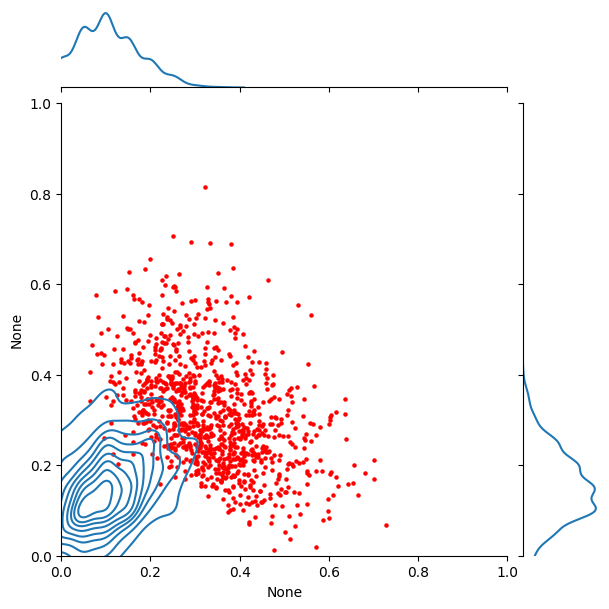

[0.6632821095278942, 0.46400326173451006]
[0.5636426856312021]
Epoch 1 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


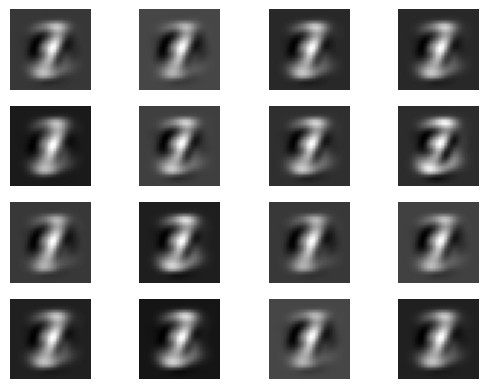

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.024888521549810833
Discriminator Loss: 4.332362186135771
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


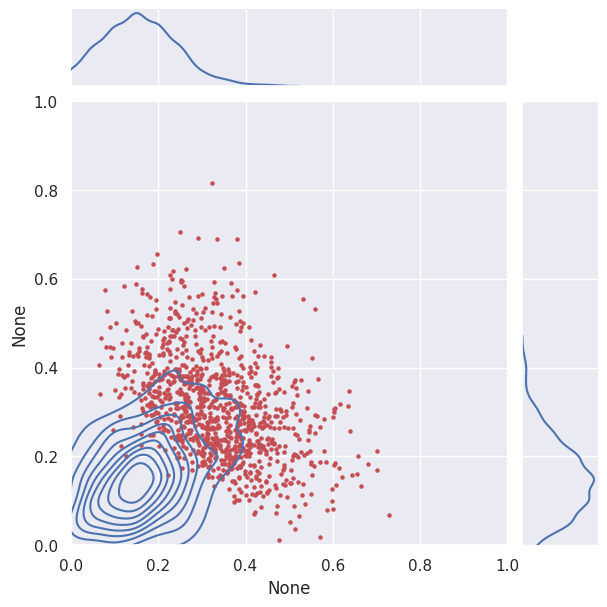

[0.49744271103454907, 0.45305614732003596]
[0.5636426856312021, 0.4752494291772925]
Epoch 2 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


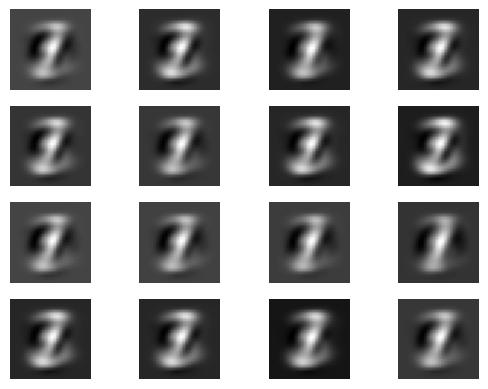

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.018805851866542957
Discriminator Loss: 4.207425470228436
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


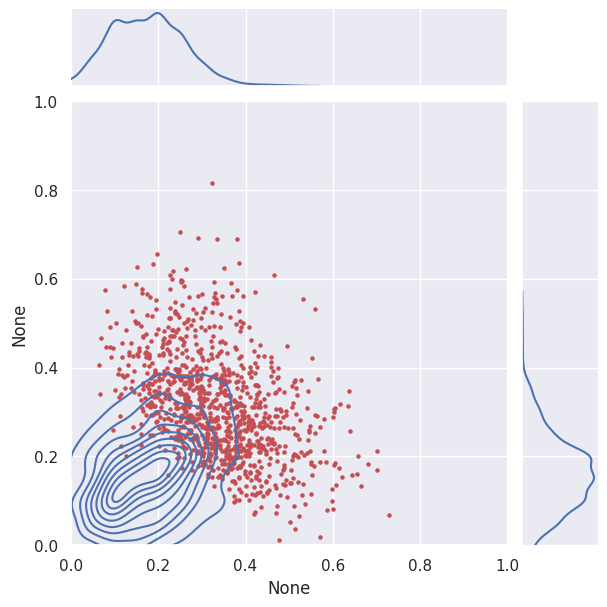

[0.4383940432340863, 0.41981889399191474]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005]
Epoch 3 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


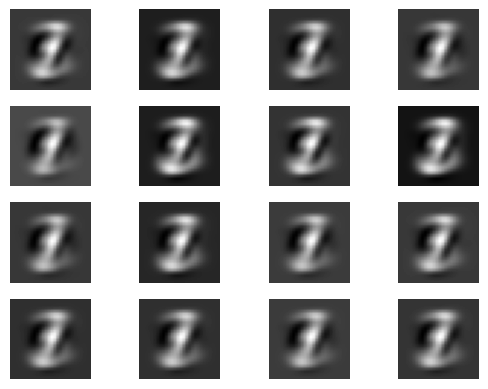

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.01833935272075252
Discriminator Loss: 4.356000277769675
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


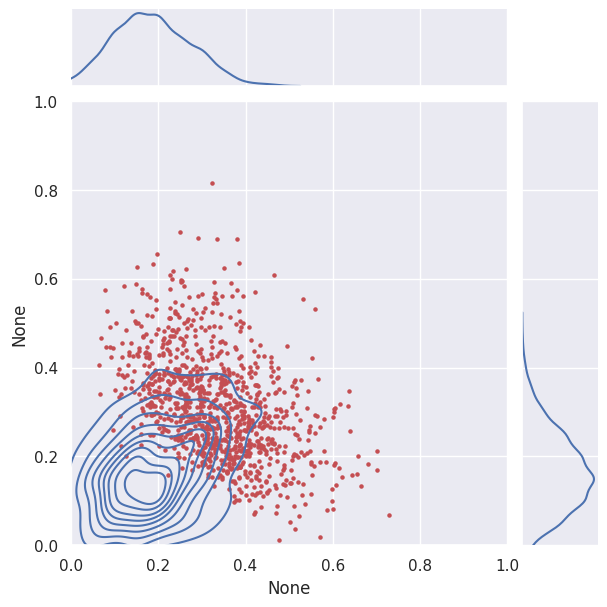

[0.40533722190993665, 0.40980061450178806]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624]
Epoch 4 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


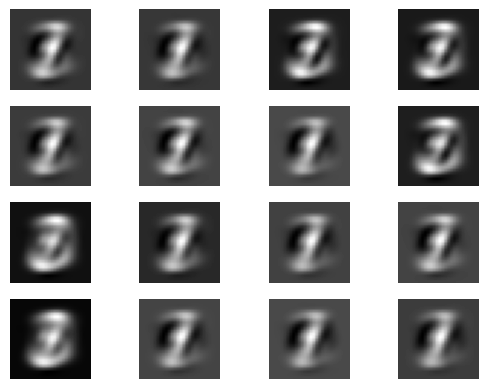

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.01666262412993181
Discriminator Loss: 4.40010914222464
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


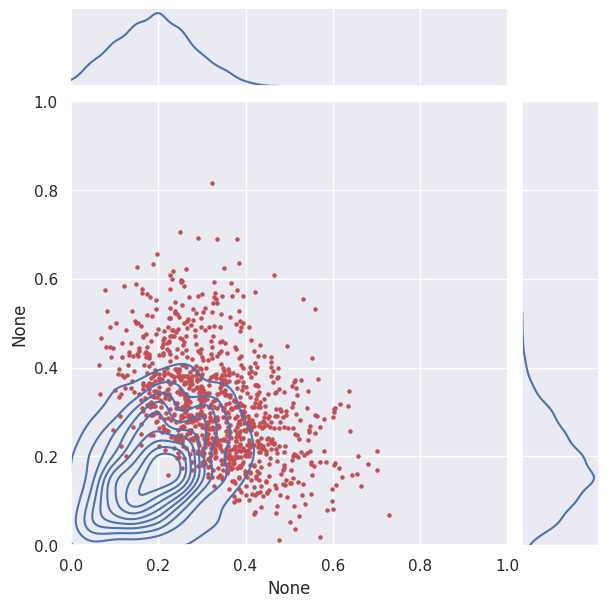

[0.4052598089955452, 0.3784368949799683]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675]
Epoch 5 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


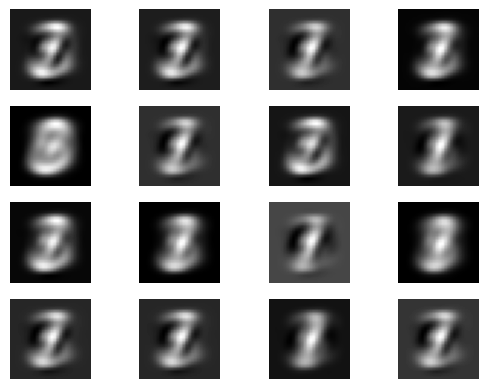

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.015009481922702418
Discriminator Loss: 4.135146556942358
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


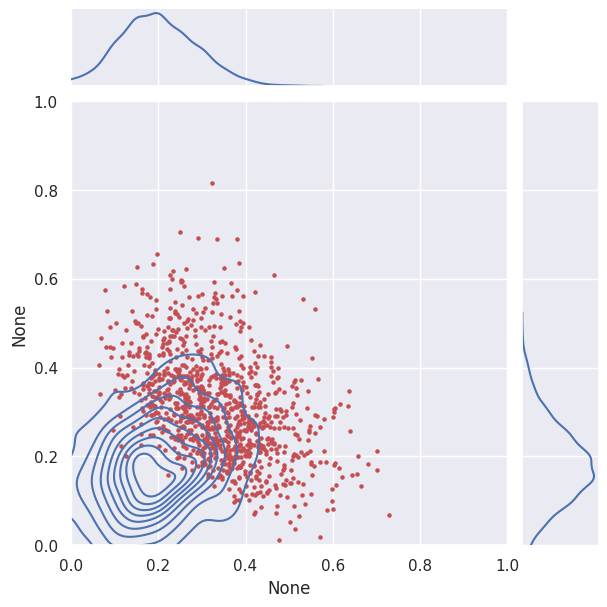

[0.3591463152565793, 0.3592622508382979]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857]
Epoch 6 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


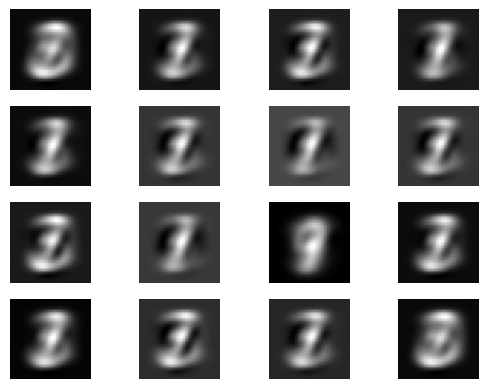

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.013267956074314568
Discriminator Loss: 4.345616019997677
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


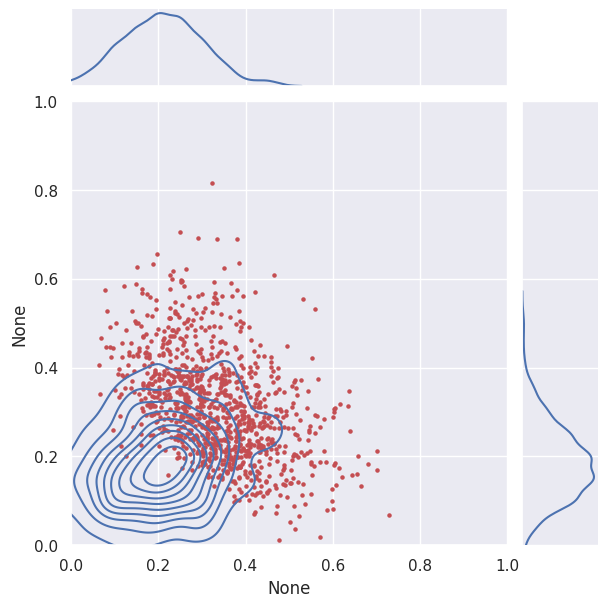

[0.3397204923965305, 0.3349475104977733]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519]
Epoch 7 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


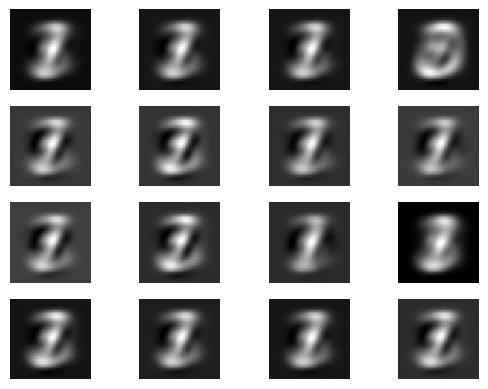

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.011989483641413721
Discriminator Loss: 4.691408044038824
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


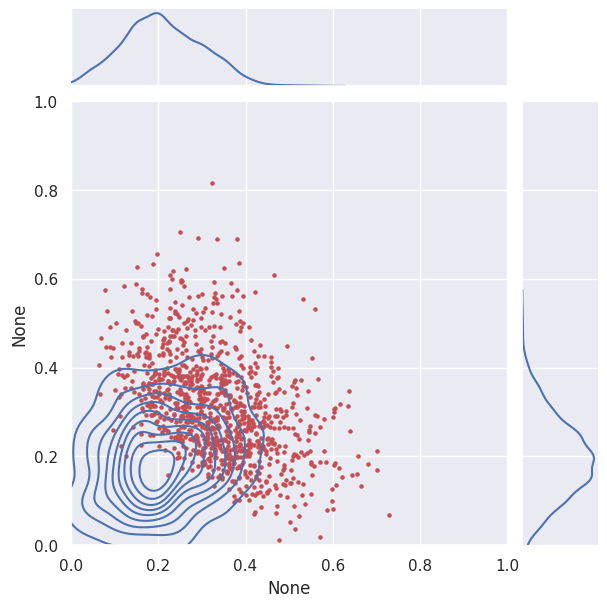

[0.32350881510457075, 0.3146126749335821]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644]
Epoch 8 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


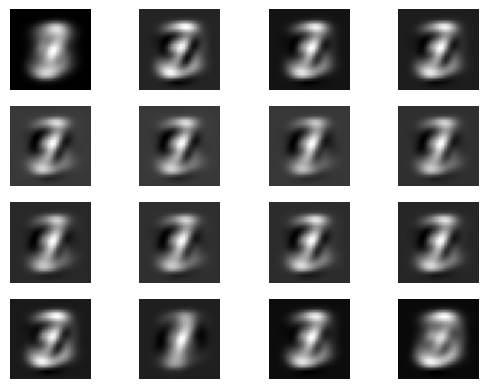

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.010590132594985884
Discriminator Loss: 4.683486384935922
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


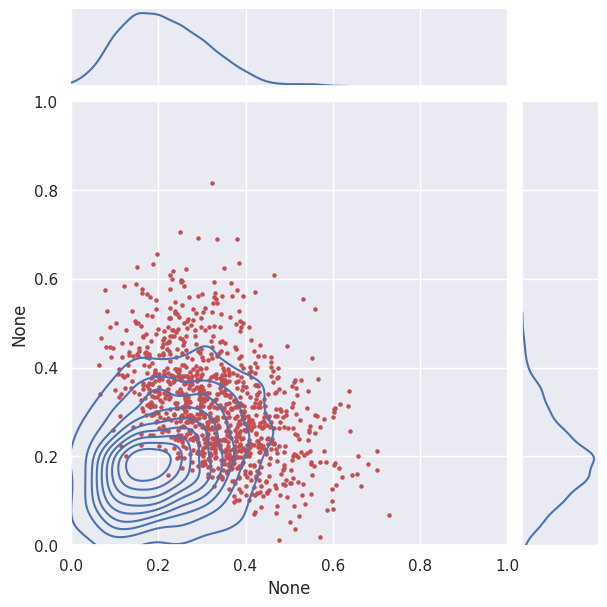

[0.30095816828170774, 0.3253423398225415]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246]
Epoch 9 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


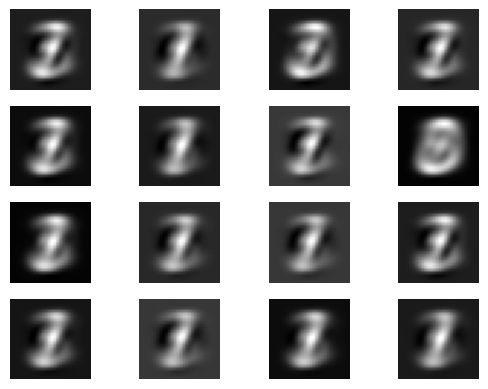

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.009342722208547304
Discriminator Loss: 4.76470064424124
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


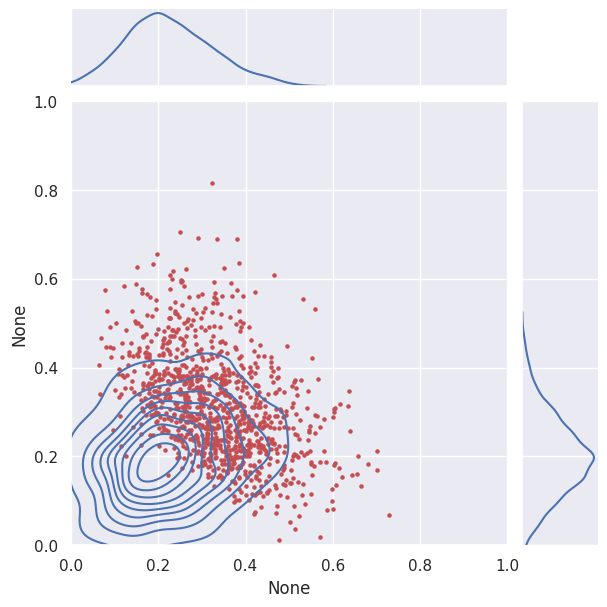

[0.26971285040955584, 0.30527511933551504]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354]
Epoch 10 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


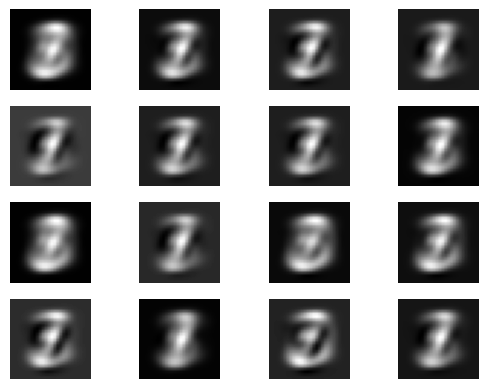

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.008061440688485104
Discriminator Loss: 5.023355858505648
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


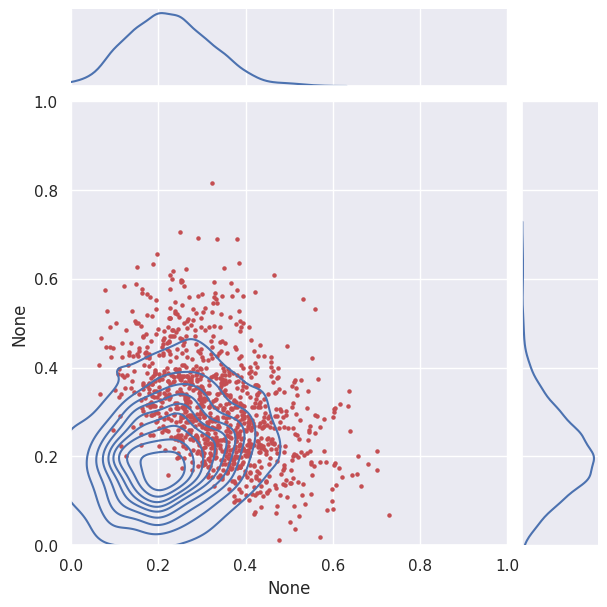

[0.27075354440604854, 0.265362004538055]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176]
Epoch 11 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


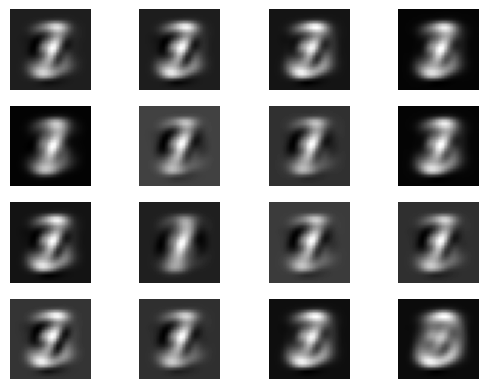

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.006945793175577722
Discriminator Loss: 5.023769167046353
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


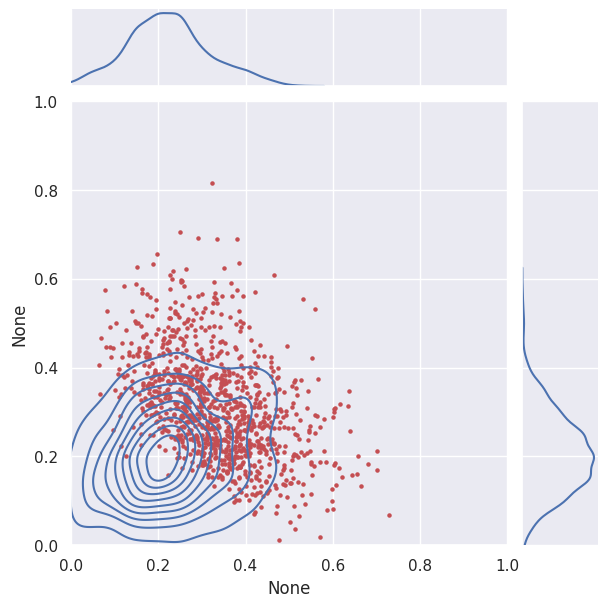

[0.29651361650094915, 0.2751256629353861]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676]
Epoch 12 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


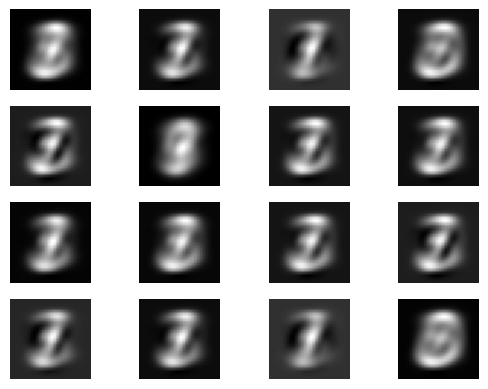

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.006159875207791051
Discriminator Loss: 5.551507839214542
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


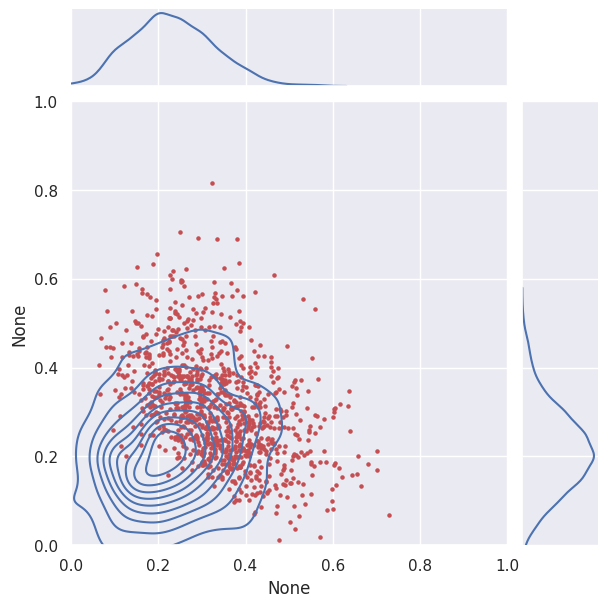

[0.24944229003523175, 0.24457485156736283]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973]
Epoch 13 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


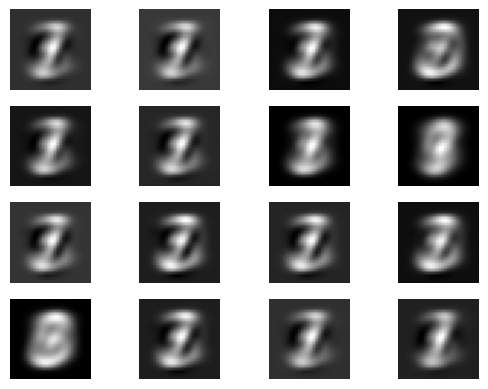

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.005304303948799815
Discriminator Loss: 5.461156347256746
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


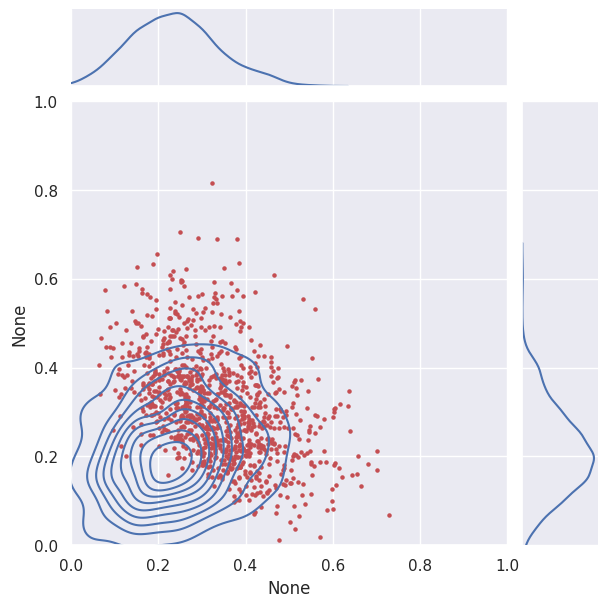

[0.23694277731774707, 0.2697435463578327]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899]
Epoch 14 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


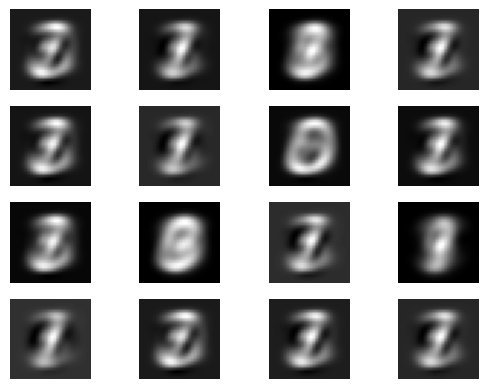

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.004948998346499072
Discriminator Loss: 5.653165408859661
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


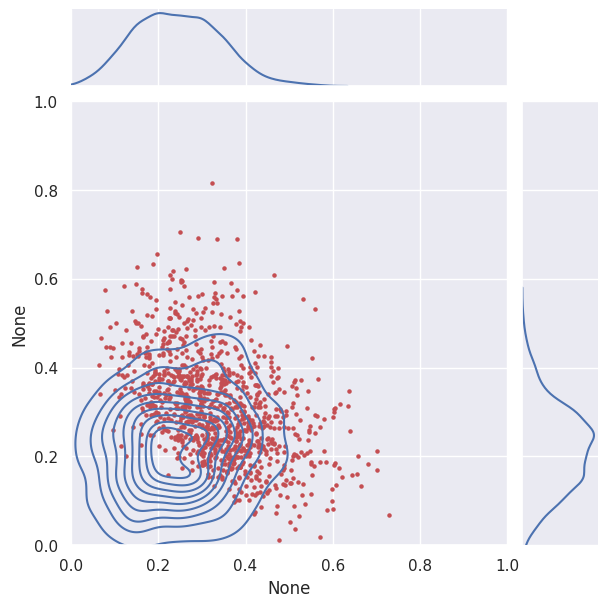

[0.2152130767318989, 0.23501532369419859]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873]
Epoch 15 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


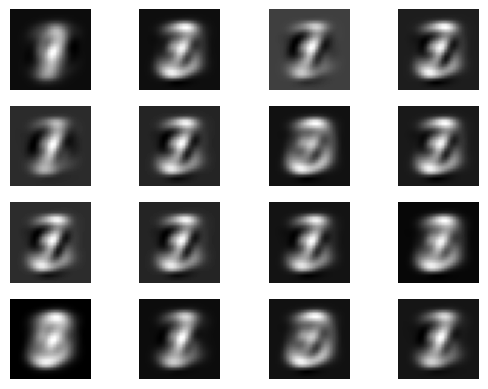

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.004543213446068058
Discriminator Loss: 5.546983875093331
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


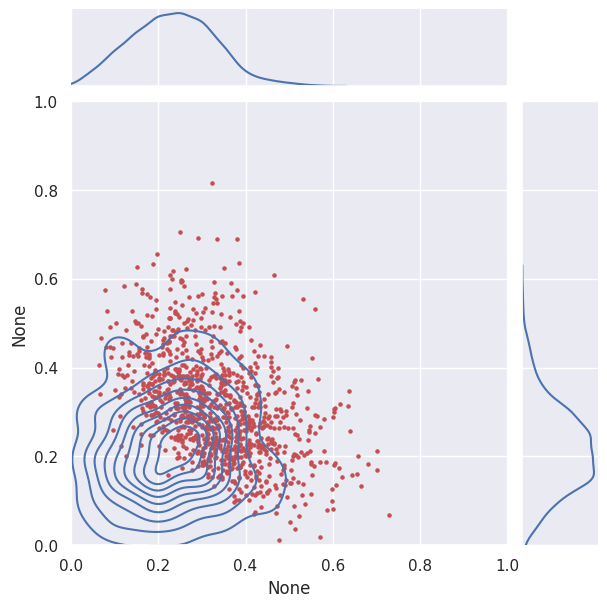

[0.2511575963459334, 0.23848914715358555]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946]
Epoch 16 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


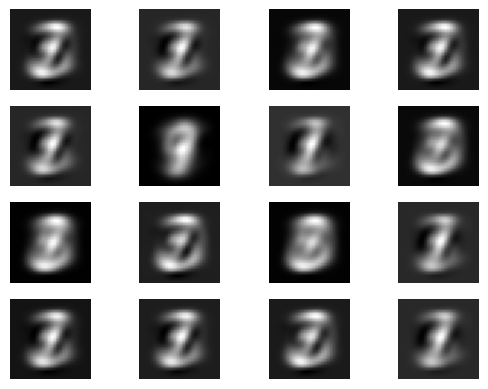

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0037436062894368387
Discriminator Loss: 5.54003230344768
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


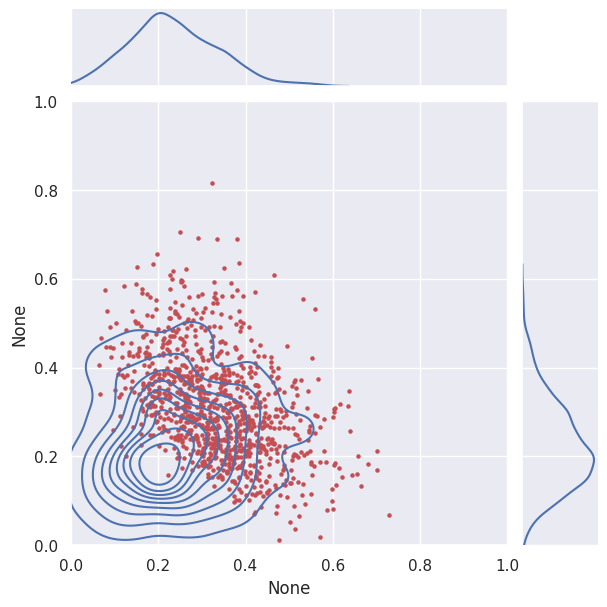

[0.23735871363781563, 0.21427759886819608]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586]
Epoch 17 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


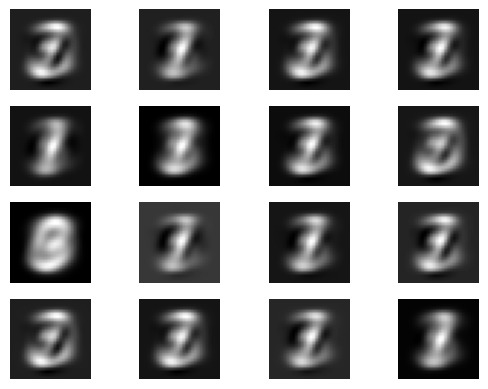

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0031591205664756525
Discriminator Loss: 5.649476124084866
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


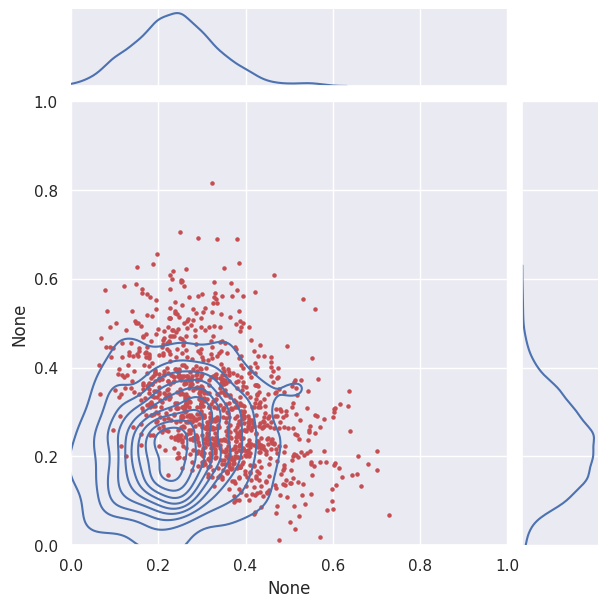

[0.2310758486344123, 0.22514597237472586]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908]
Epoch 18 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


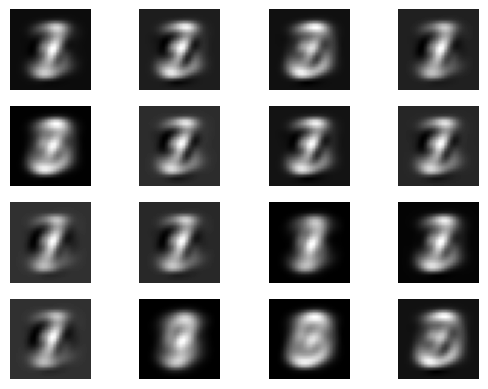

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.003057810064129633
Discriminator Loss: 5.648658128129234
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


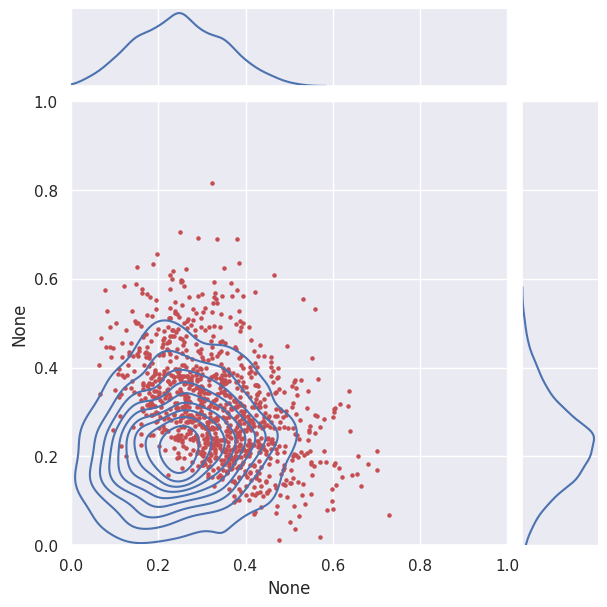

[0.20879648058057185, 0.20824382723056528]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855]
Epoch 19 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


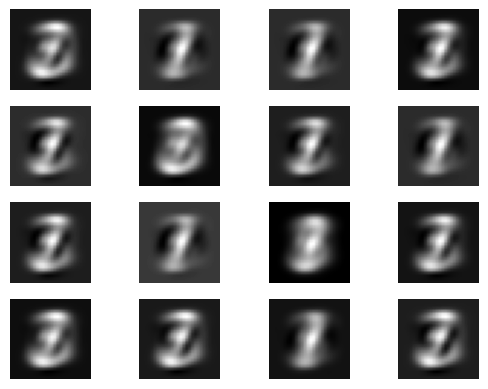

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0026175396302857315
Discriminator Loss: 5.450853350698303
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


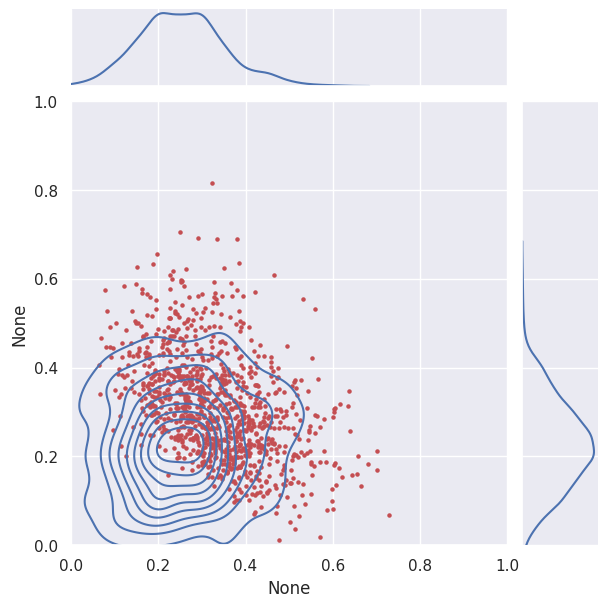

[0.17909242120557814, 0.19779826813471899]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856]
Epoch 20 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


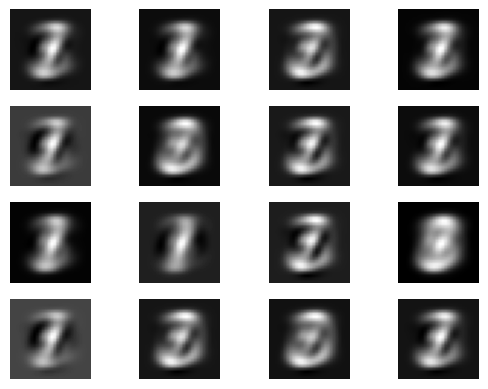

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0022009284198598795
Discriminator Loss: 6.232364820011449
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


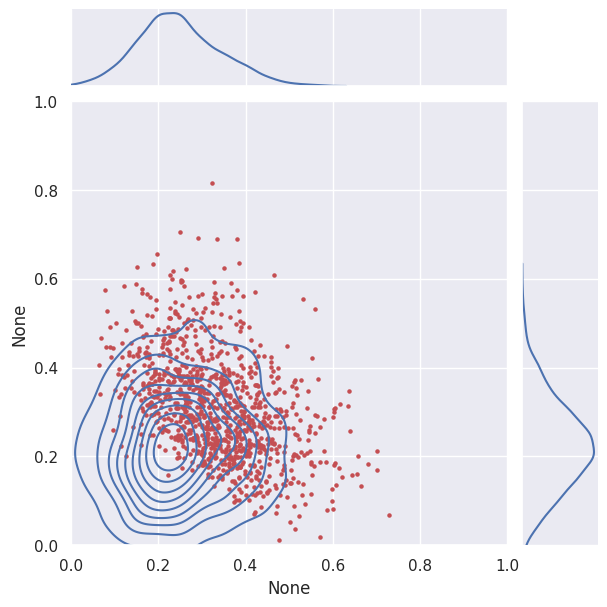

[0.2174299806085298, 0.20600267197153466]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223]
Epoch 21 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


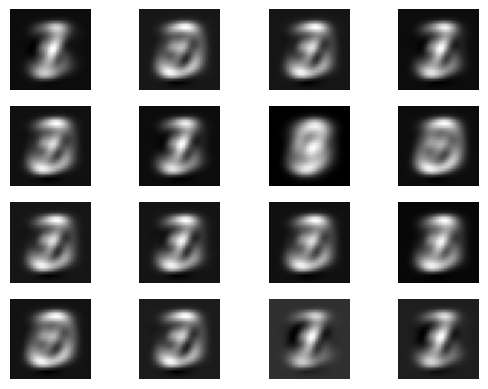

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0020803165825204434
Discriminator Loss: 6.738316348019121
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


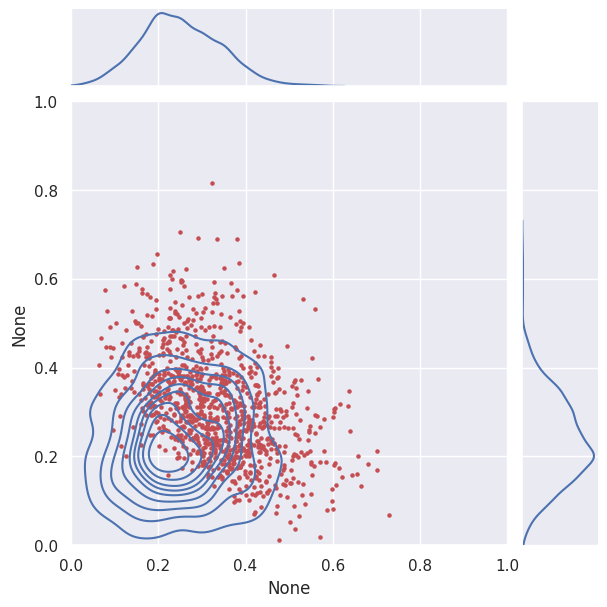

[0.21339412694732168, 0.19243769306956388]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278]
Epoch 22 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


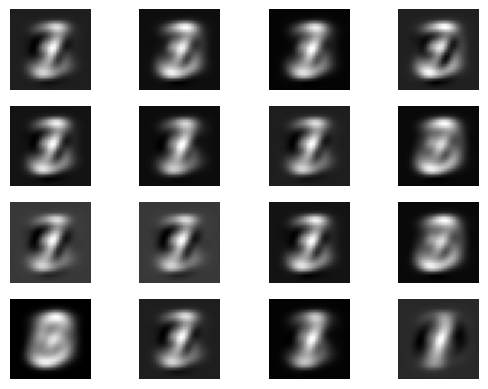

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0016287767154942985
Discriminator Loss: 7.841395649191515
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


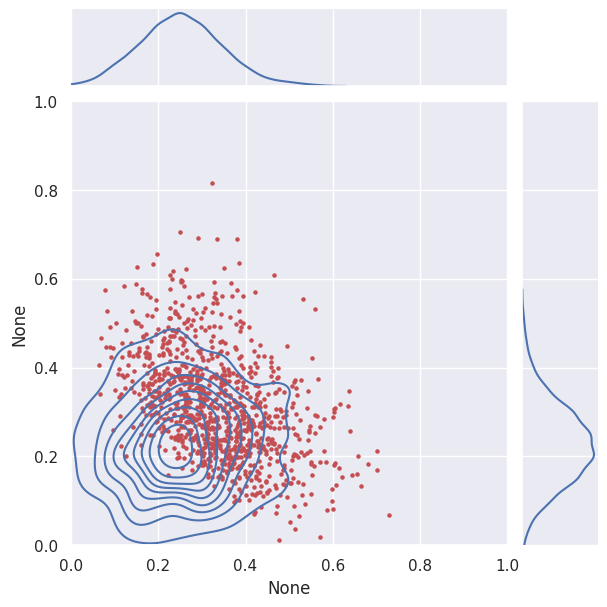

[0.19884543673058347, 0.21364284787058582]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463]
Epoch 23 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


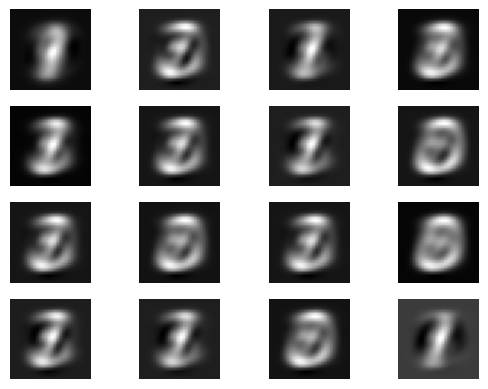

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.001644432299633861
Discriminator Loss: 6.459997258683693
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


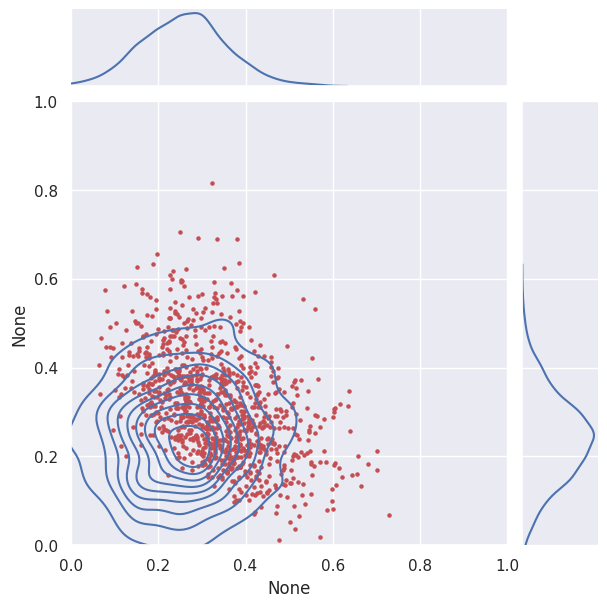

[0.17701854522236204, 0.17176040545958352]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277]
Epoch 24 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


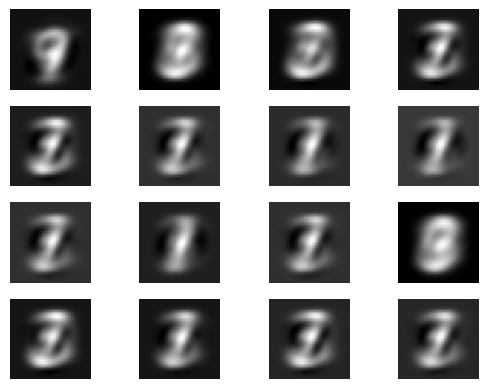

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0015199300784460514
Discriminator Loss: 6.233587065019993
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


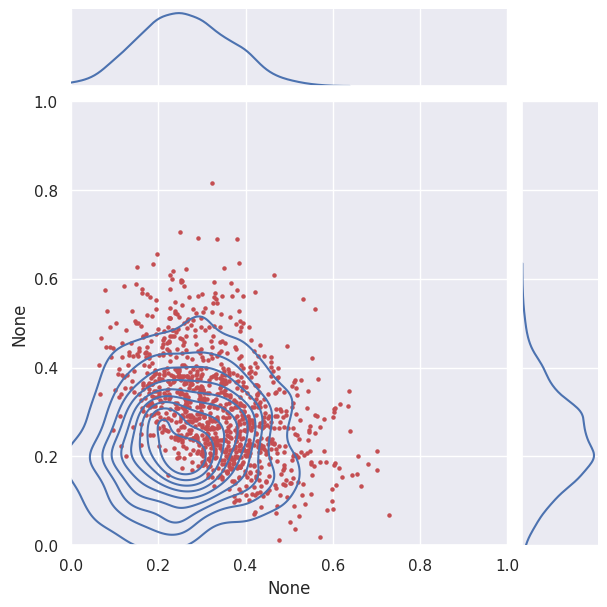

[0.16778651438747721, 0.1783049043585899]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354]
Epoch 25 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


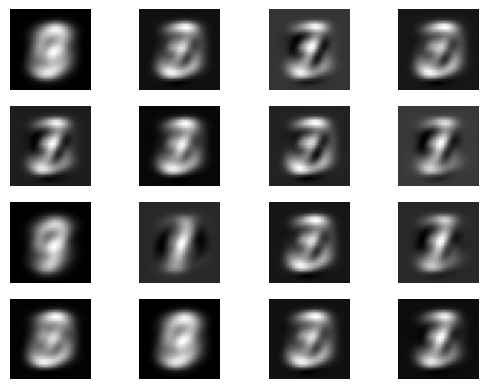

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0013370375633955788
Discriminator Loss: 7.151918197520532
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


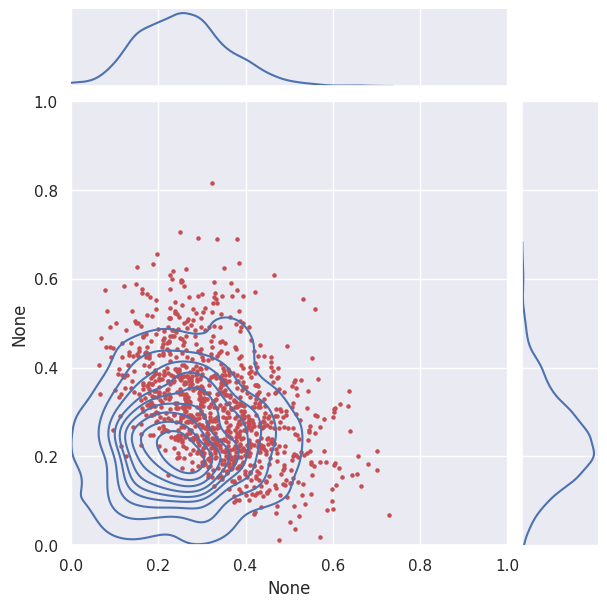

[0.1668081445433619, 0.16792317180676372]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283]
Epoch 26 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


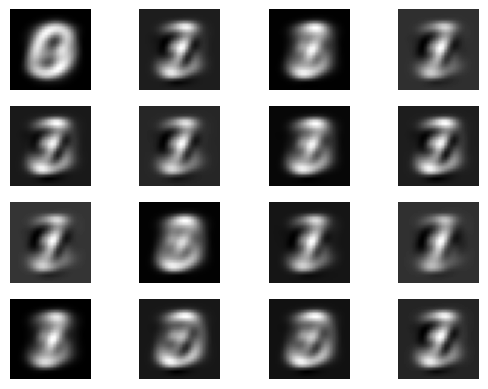

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0010065538637257696
Discriminator Loss: 6.743190443777366
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


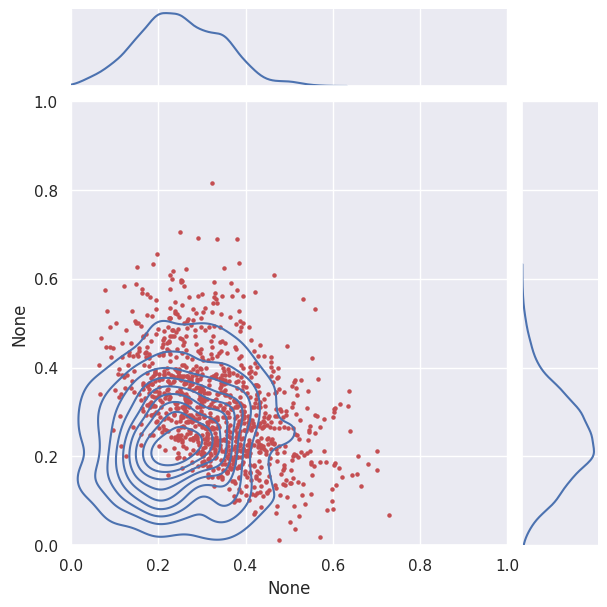

[0.2043576712352282, 0.1675401521138195]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385]
Epoch 27 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


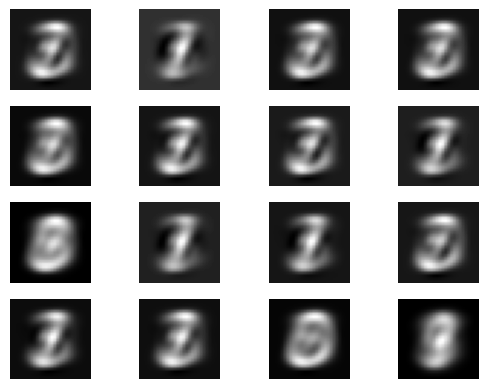

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0010687067981406775
Discriminator Loss: 6.235627465646266
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


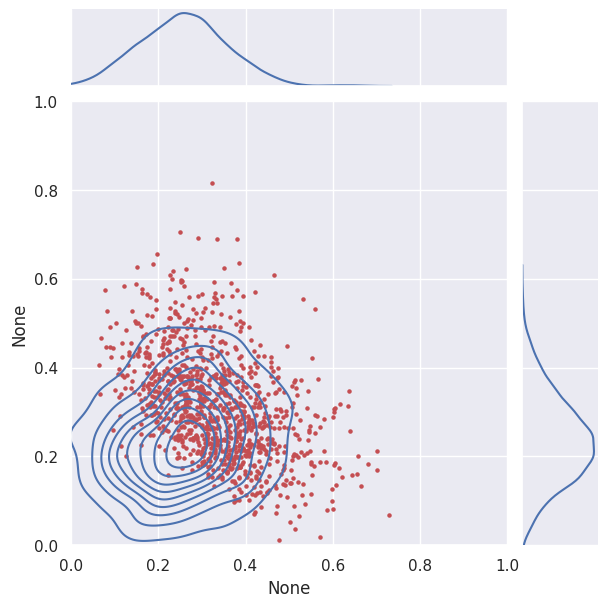

[0.17226599205917034, 0.18129946291988902]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967]
Epoch 28 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


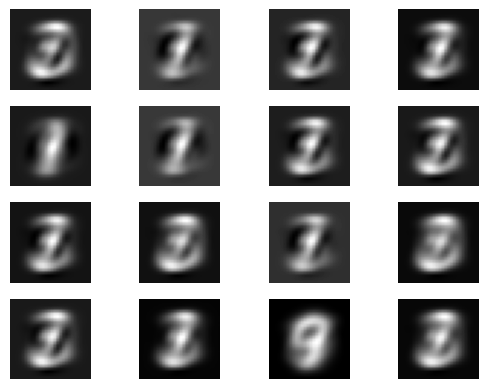

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0009948403018300834
Discriminator Loss: 6.0459798687602575
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


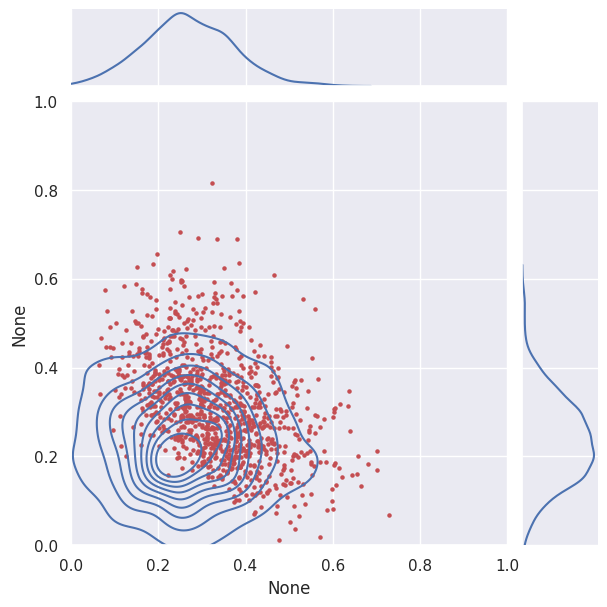

[0.1449786670632145, 0.17813832981911337]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393]
Epoch 29 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


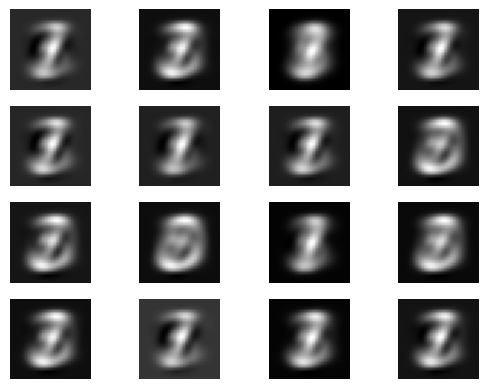

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0008626583767400635
Discriminator Loss: 6.233179484007626
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


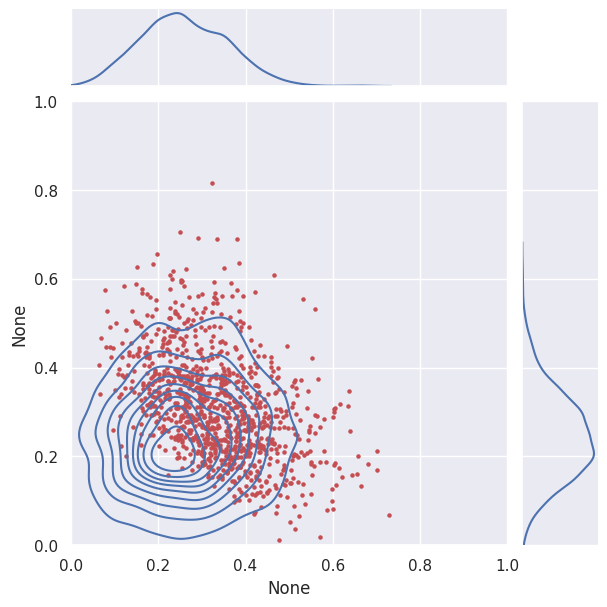

[0.17025691566475337, 0.14707555741499687]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751]
Epoch 30 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


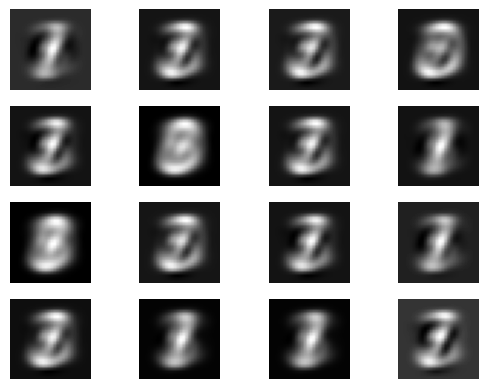

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0008121441619196548
Discriminator Loss: 7.14824846863157
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


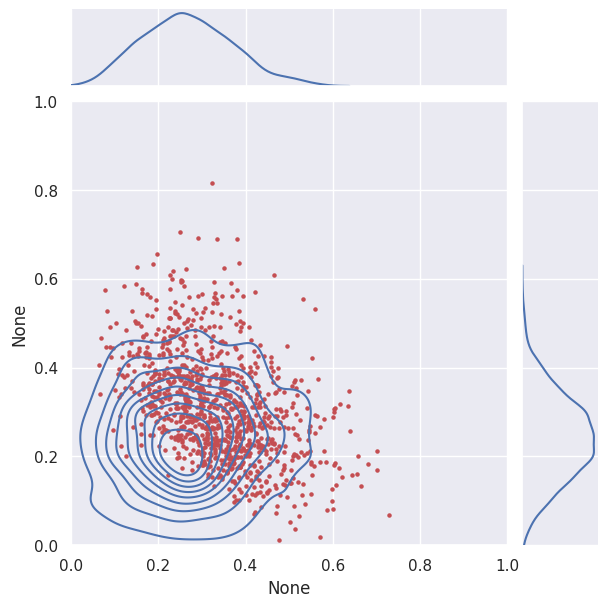

[0.15157481252279437, 0.16591827403240214]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824]
Epoch 31 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


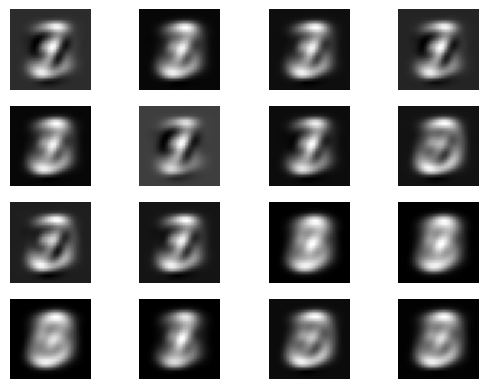

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0006916539526371912
Discriminator Loss: 7.144186724623392
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


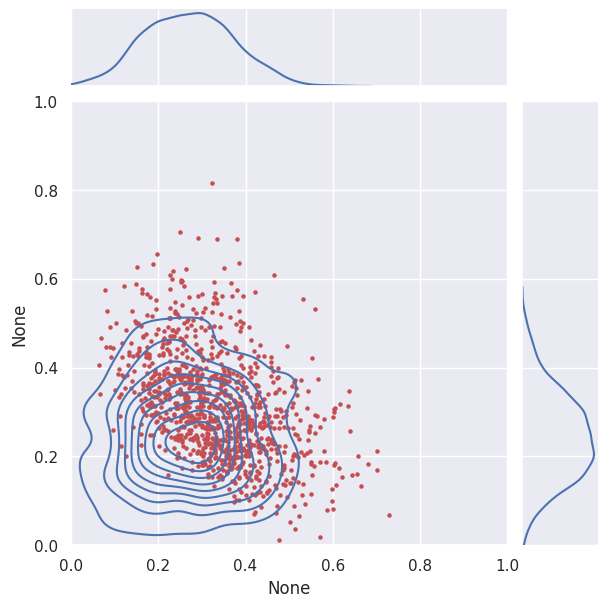

[0.13738073152175284, 0.16020892960297353]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632]
Epoch 32 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


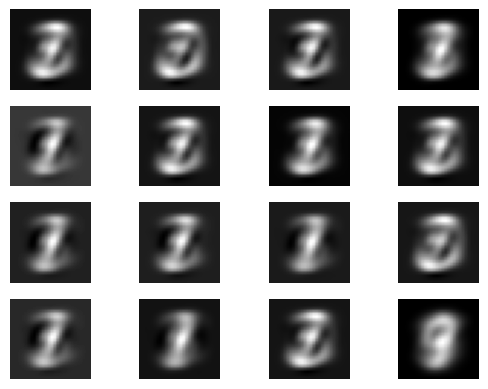

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0006527505500153031
Discriminator Loss: 7.834904754191278
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


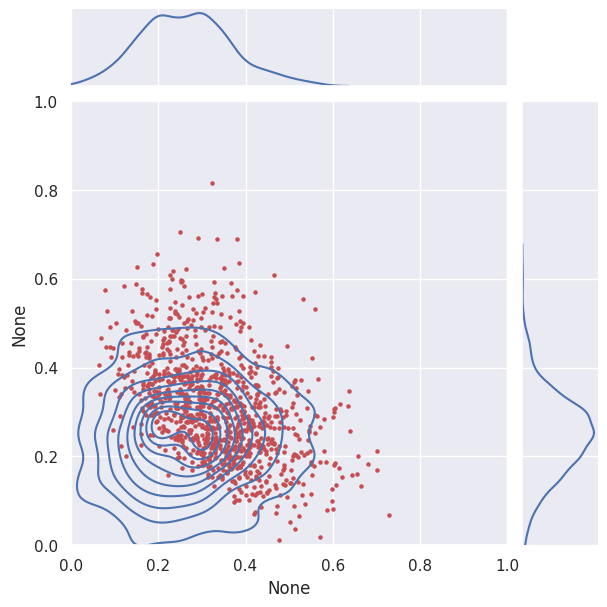

[0.16247745553373677, 0.16807180666812252]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966]
Epoch 33 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


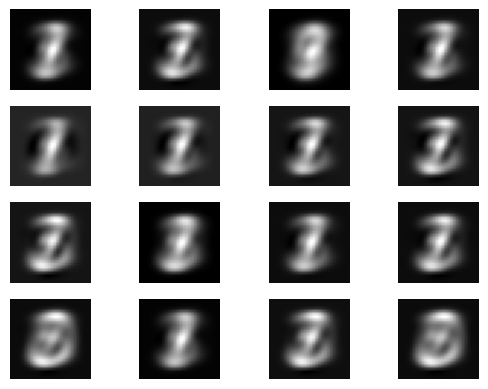

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0005517283975604477
Discriminator Loss: 6.741563104117991
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


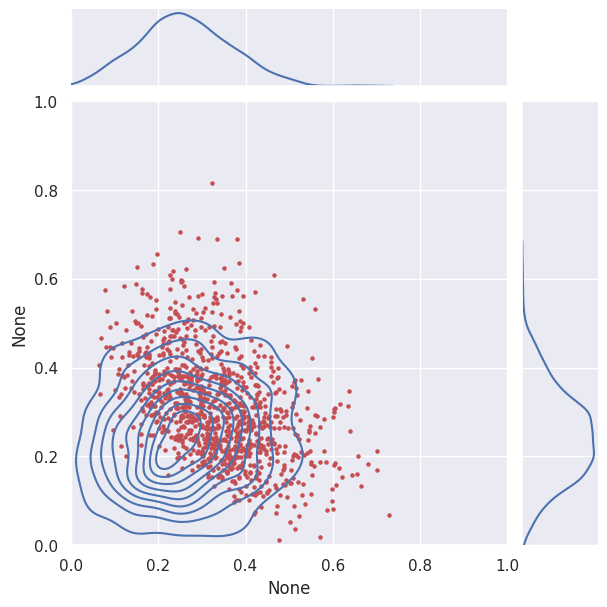

[0.15269003547713486, 0.15074076415133372]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343]
Epoch 34 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


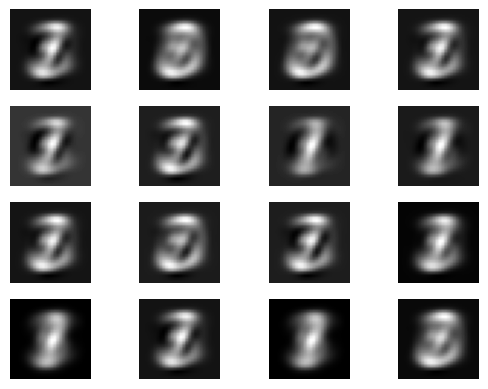

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00048174925141613385
Discriminator Loss: 7.838956623592156
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


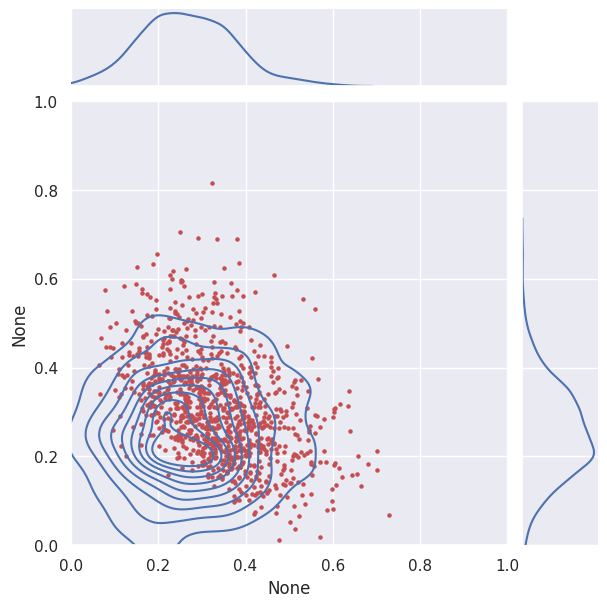

[0.13360971837991215, 0.12747478169623594]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404]
Epoch 35 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


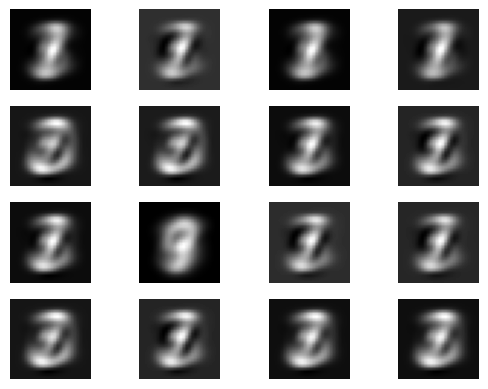

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00045066264410048855
Discriminator Loss: 7.836928636687416
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


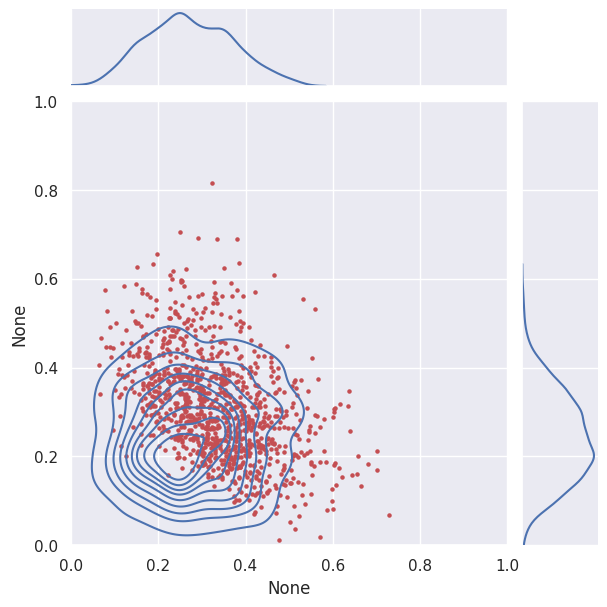

[0.1541339502039403, 0.16947673071510477]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255]
Epoch 36 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


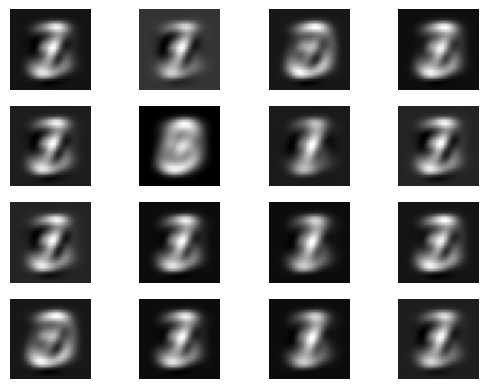

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0003418656940746187
Discriminator Loss: 7.837333905183337
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


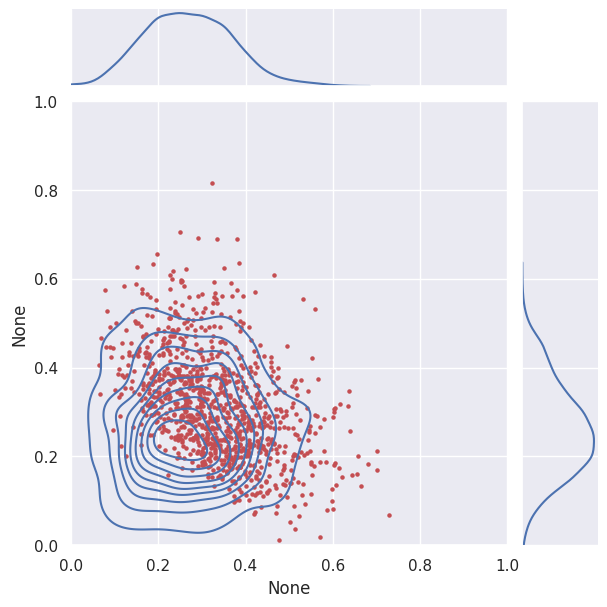

[0.1370076180182849, 0.131822226722551]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797]
Epoch 37 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


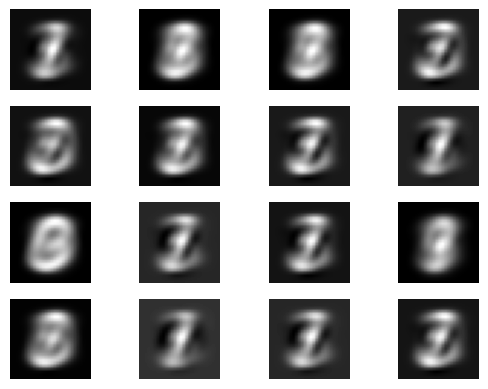

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00035741678526443355
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


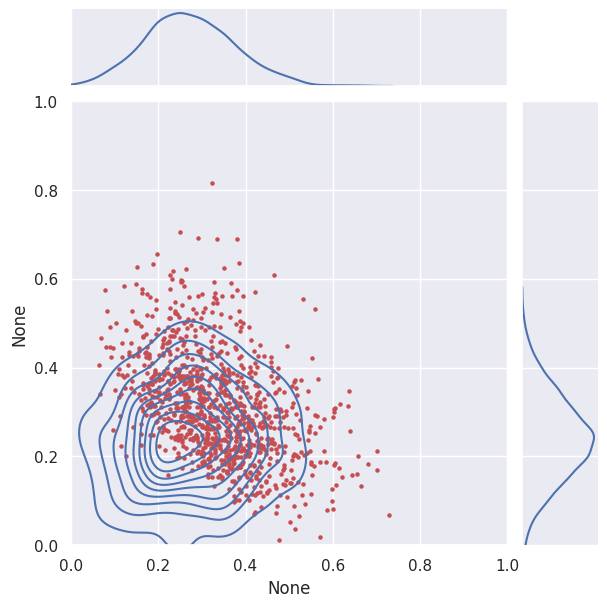

[0.12053531621110343, 0.17949127625240605]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474]
Epoch 38 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


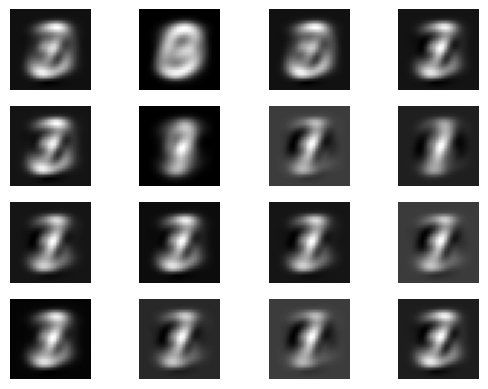

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0003612948287870235
Discriminator Loss: 7.836523532367514
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


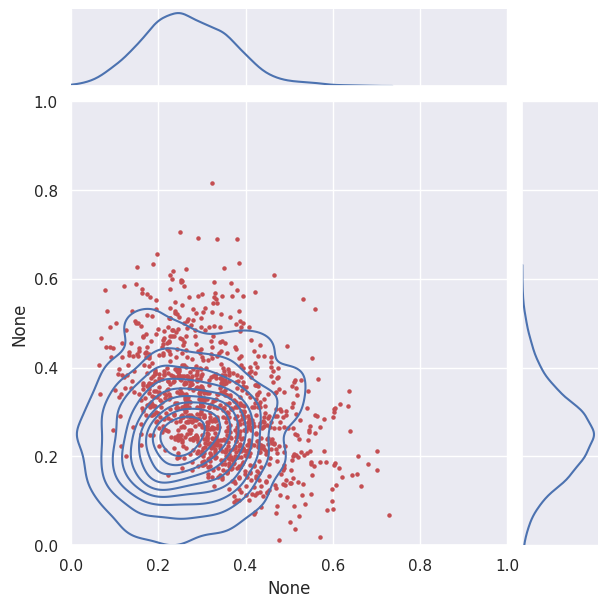

[0.13669067050080883, 0.1487361281117347]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175]
Epoch 39 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


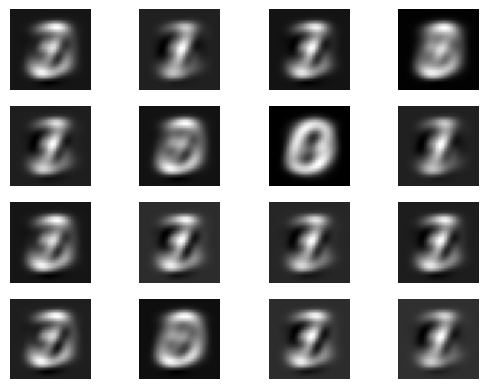

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0003496420151214194
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


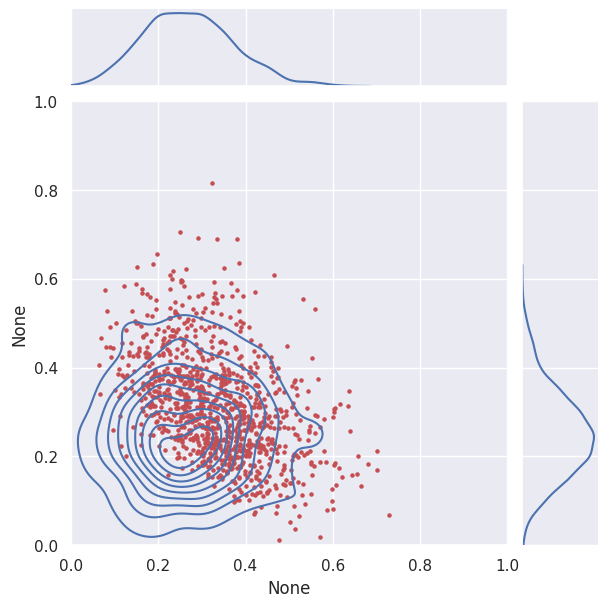

[0.1364826973486329, 0.14696283673163277]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328]
Epoch 40 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


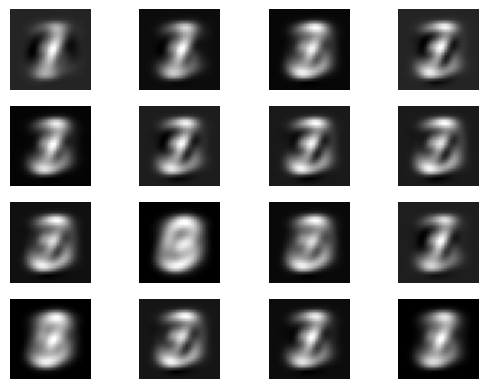

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0002292015929848363
Discriminator Loss: 6.739532646567609
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


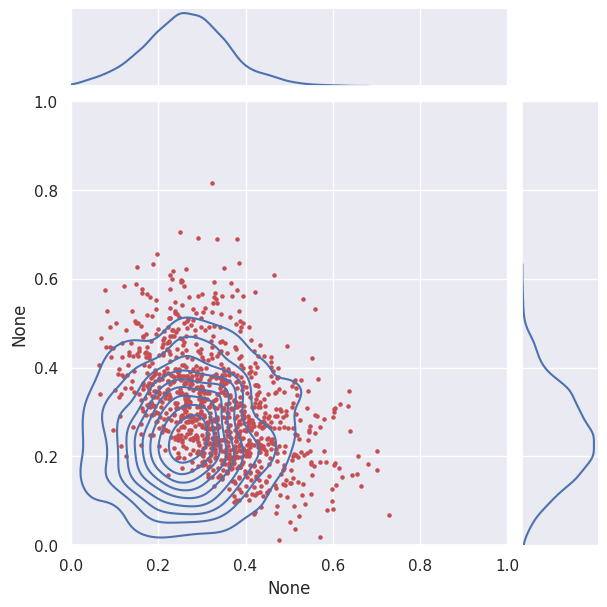

[0.1654832849659033, 0.1703948354089781]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407]
Epoch 41 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


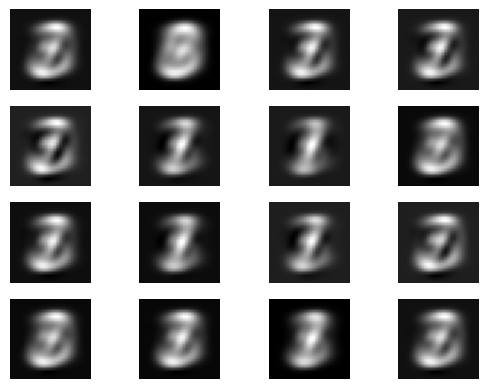

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00022920936992944335
Discriminator Loss: 7.837739337988404
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


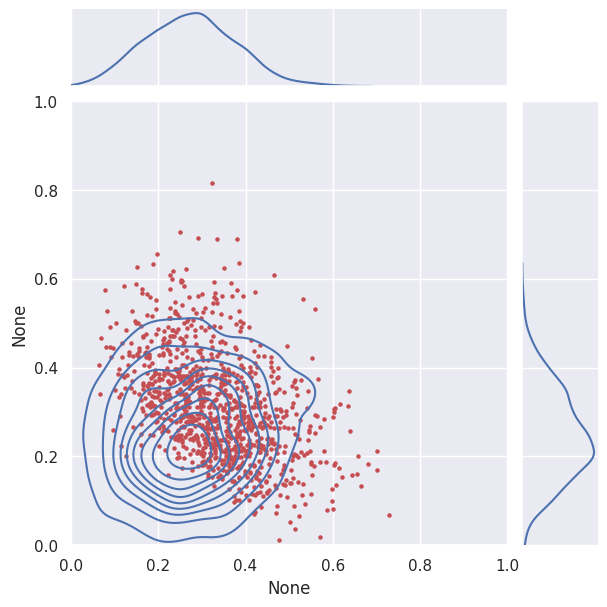

[0.1210157046760408, 0.15454848111560485]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283]
Epoch 42 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


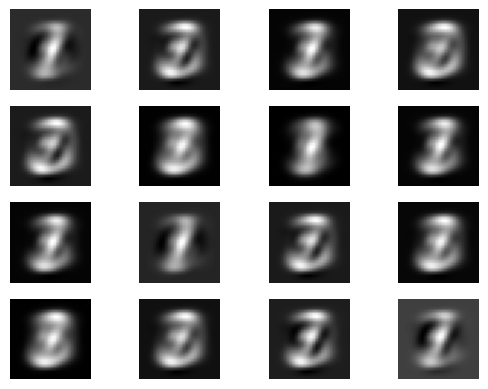

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0002486322823388883
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


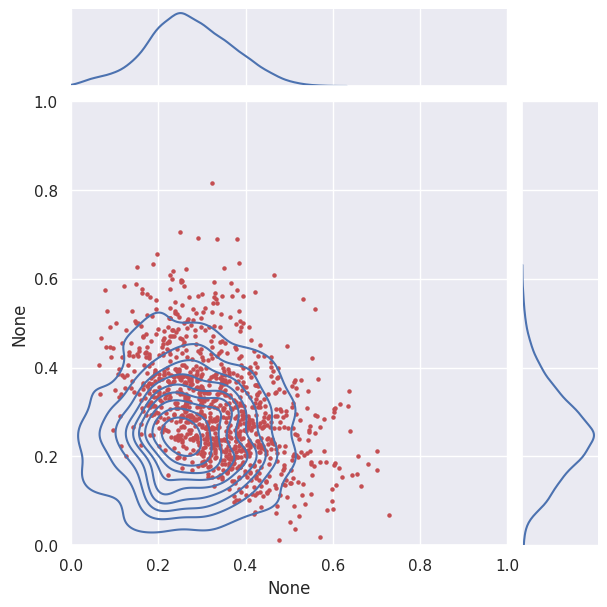

[0.16452386480631676, 0.15122710971012832]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254]
Epoch 43 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


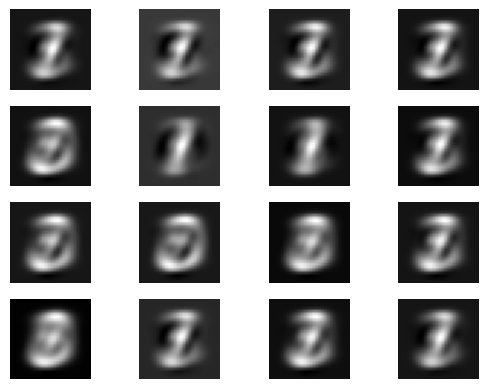

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.000248618289319103
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


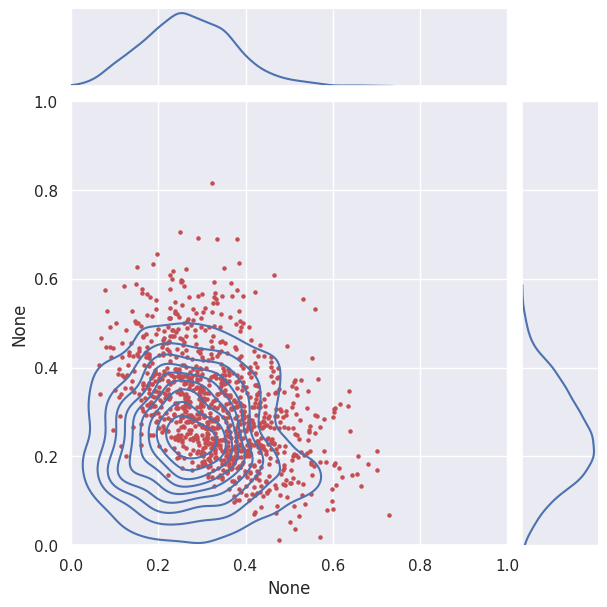

[0.13547973231716462, 0.1625381531141768]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072]
Epoch 44 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


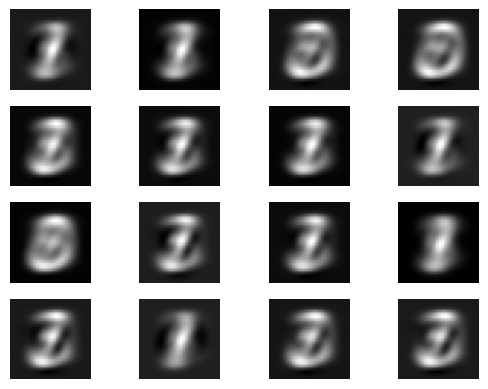

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0001903433235600267
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


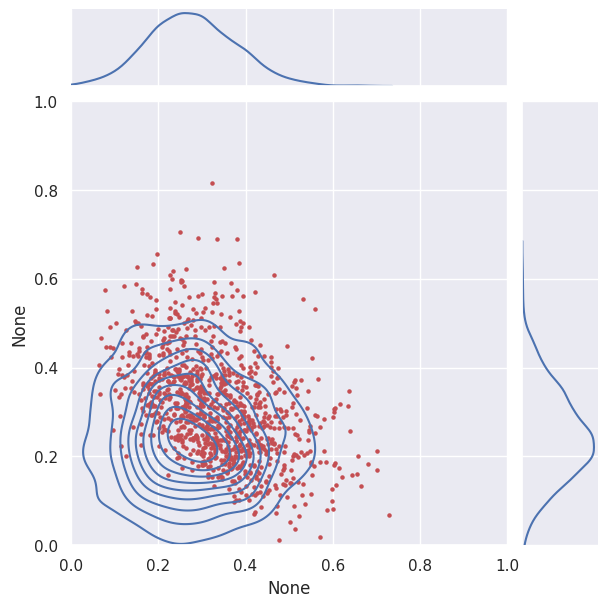

[0.11424200799984661, 0.15230003923102234]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447]
Epoch 45 Generated Images


/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


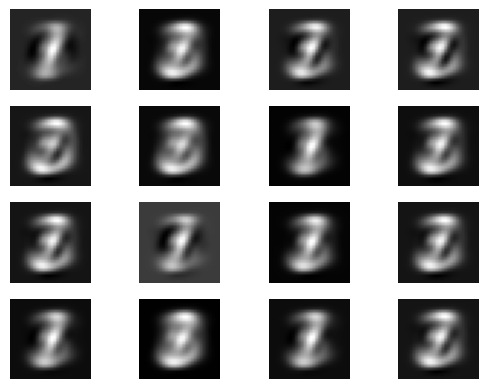

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00017869361668779613
Discriminator Loss: 7.143376351807569
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


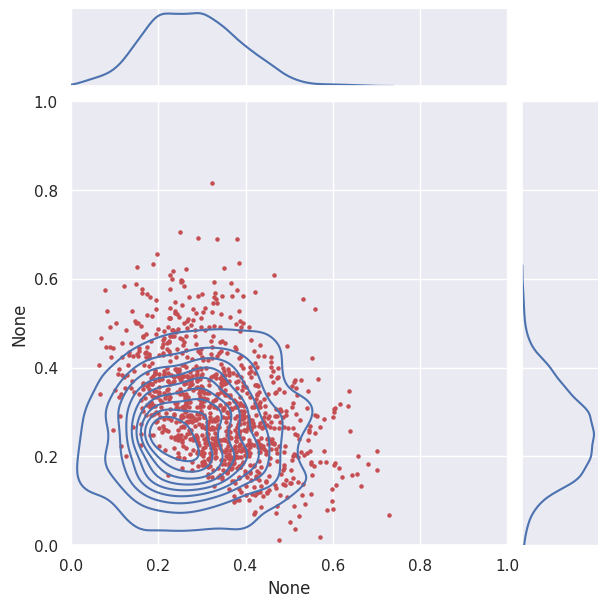

[0.10547037500688111, 0.1493499135746591]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701]
Epoch 4

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


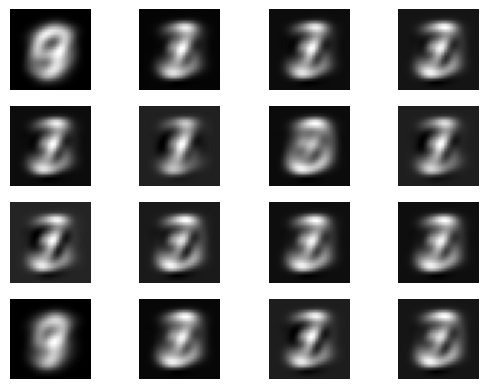

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00014373361357957398
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


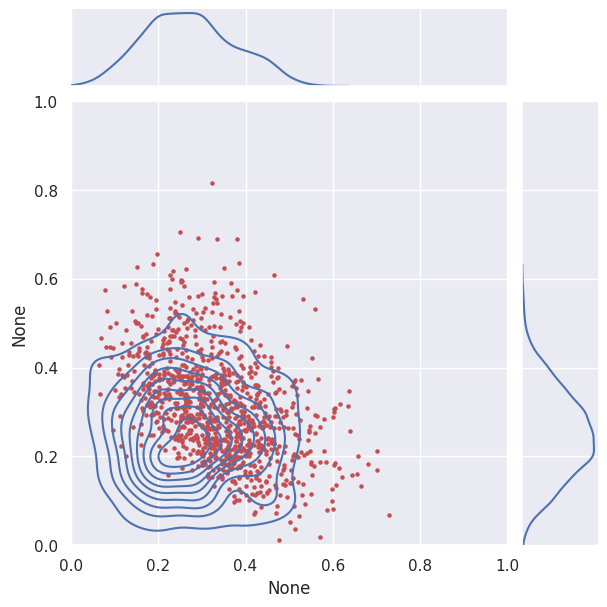

[0.14677662196418112, 0.1531191351295596]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.14994

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


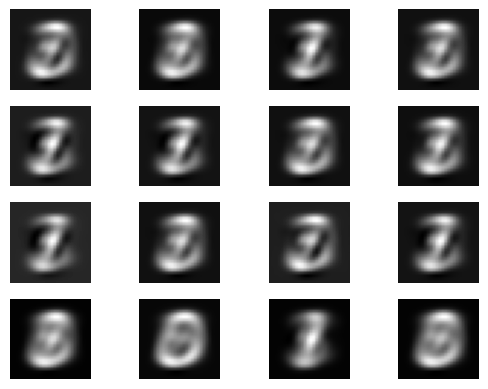

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00011265321859825187
Discriminator Loss: 7.838956623592156
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


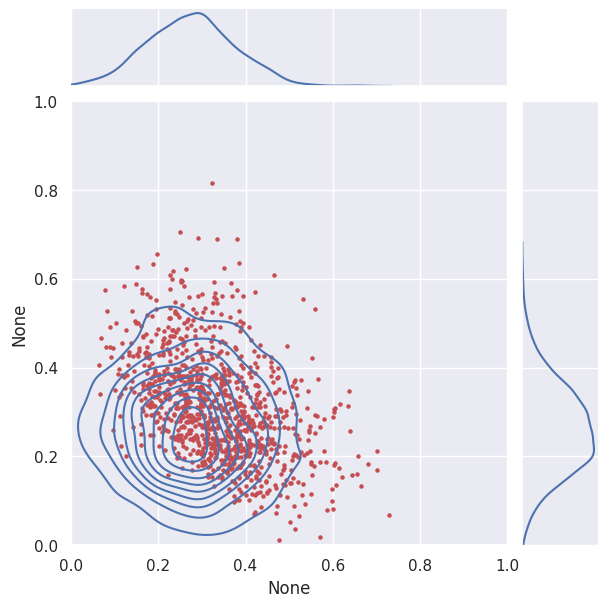

[0.1327879462964089, 0.10779004068975022]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.14994

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


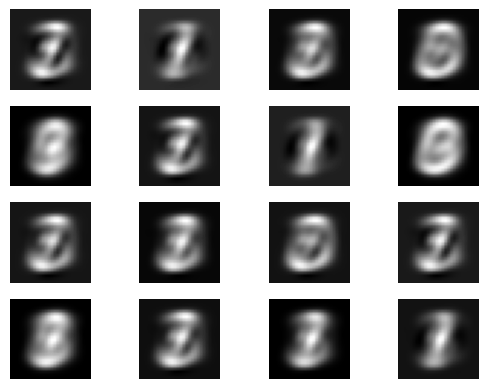

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.0001281871975223241
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


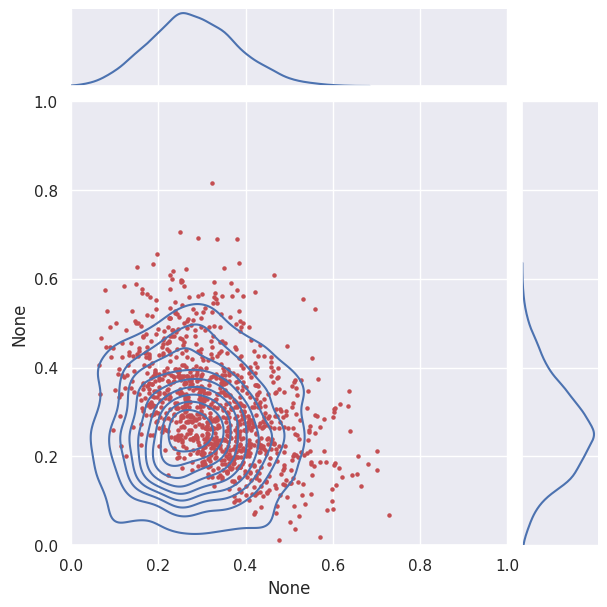

[0.11457295137587184, 0.1248726409483422]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.14994

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


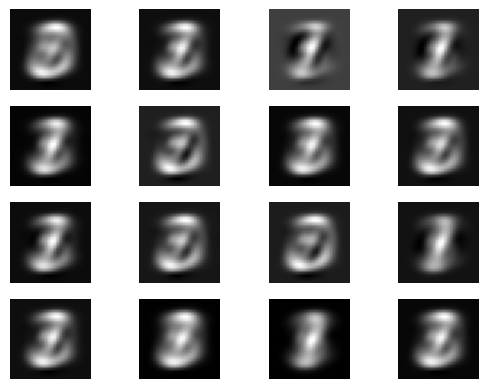

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00011265166395660469
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


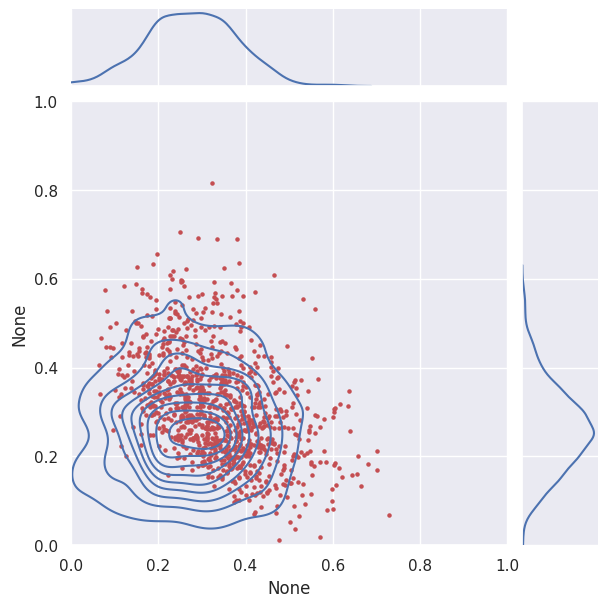

[0.1311474567502149, 0.13500657802858557]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.14994

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


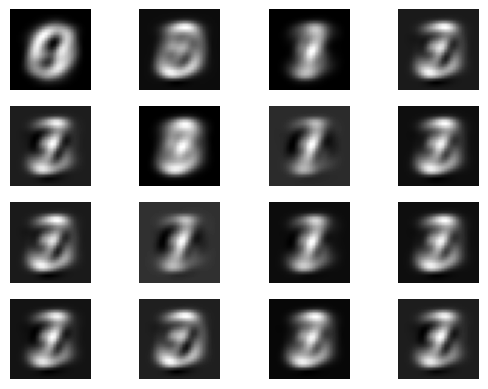

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00011264699878670257
Discriminator Loss: 7.835309203135113
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


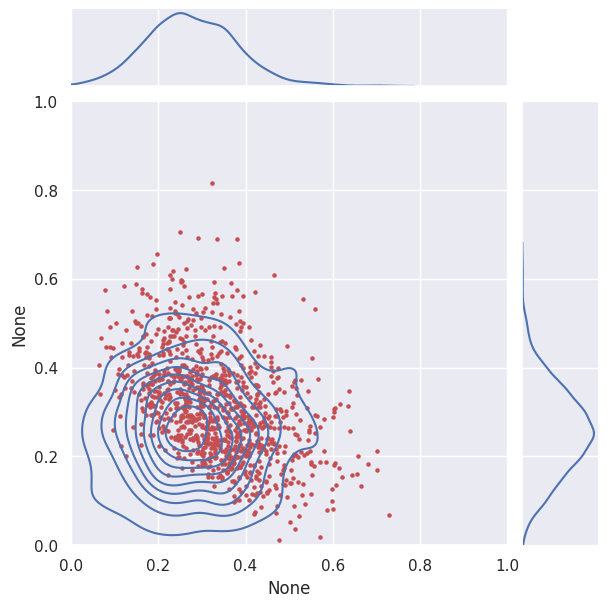

[0.11727009027318942, 0.12326234328101175]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


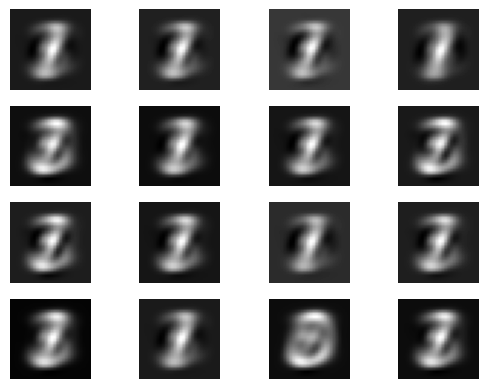

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00012818719627736365
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


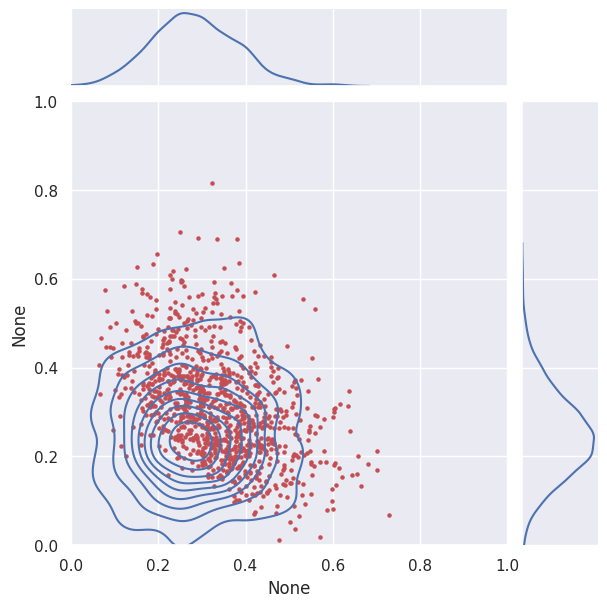

[0.10120825112570606, 0.14414063867271718]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


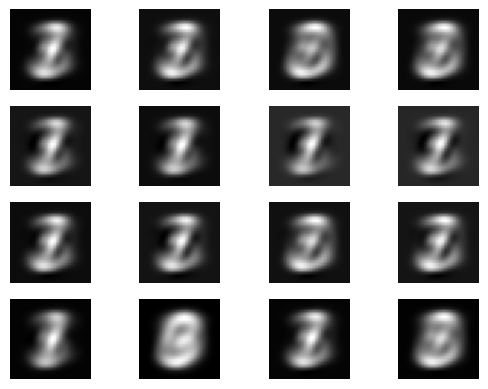

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00010487845468301926
Discriminator Loss: 7.838550697059284
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


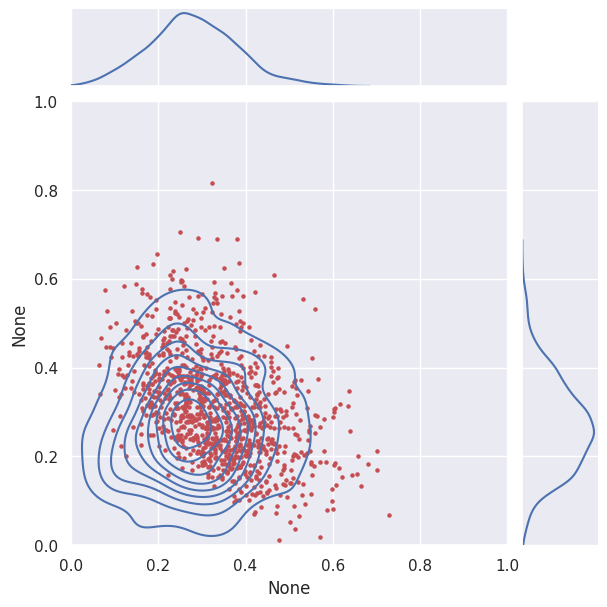

[0.10650846871204318, 0.08747381172212283]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


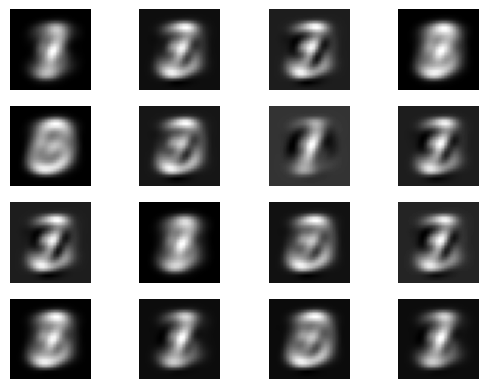

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00014372272984308307
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


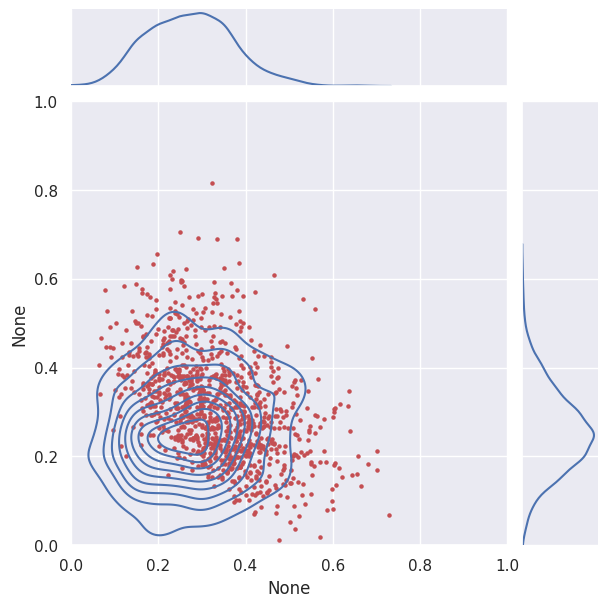

[0.1362996402601976, 0.13394835289423265]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.14994

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


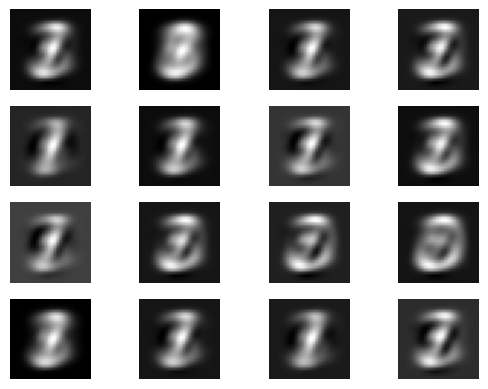

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 7.768699567848045e-05
Discriminator Loss: 7.834096346709903
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


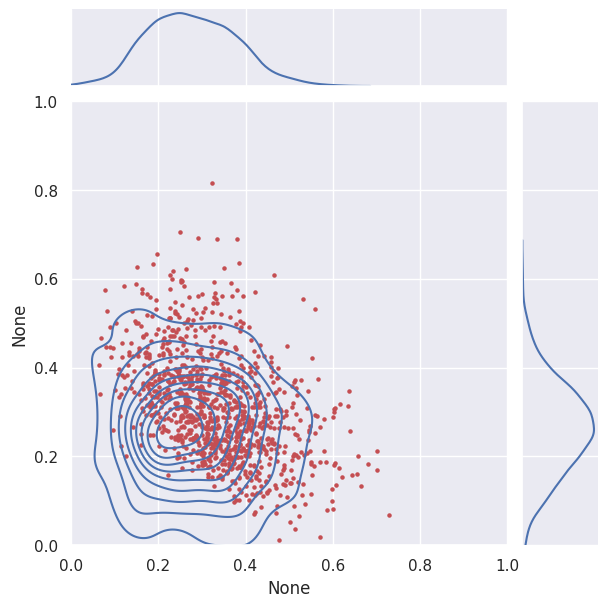

[0.1144134189169407, 0.10782855558920566]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.14994

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


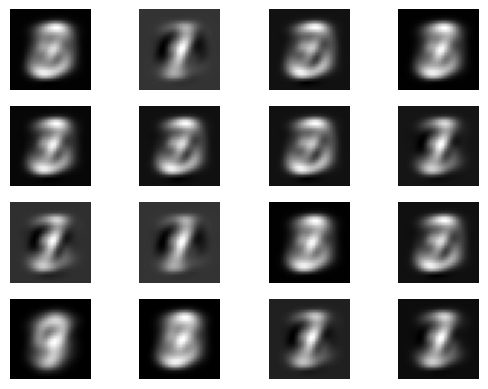

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00010099884780107969
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


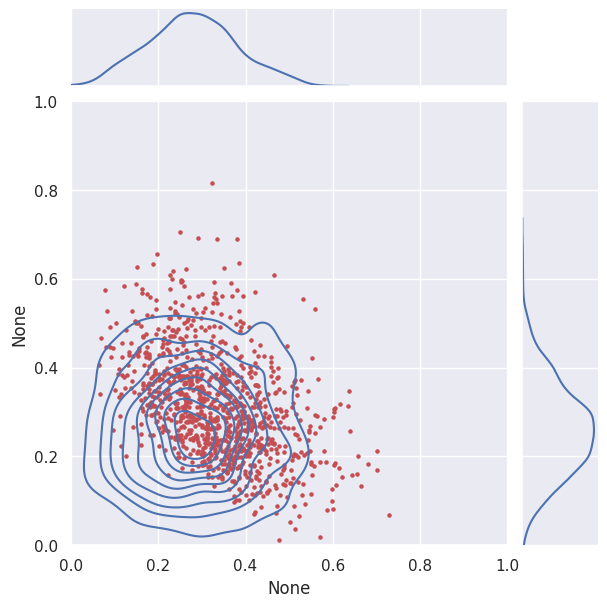

[0.1351218981022401, 0.09801617242178828]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.14994

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


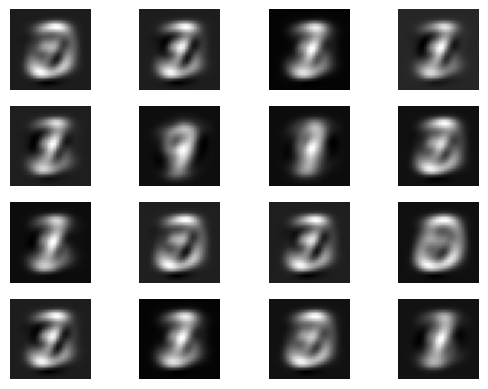

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 0.00012430447886716917
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


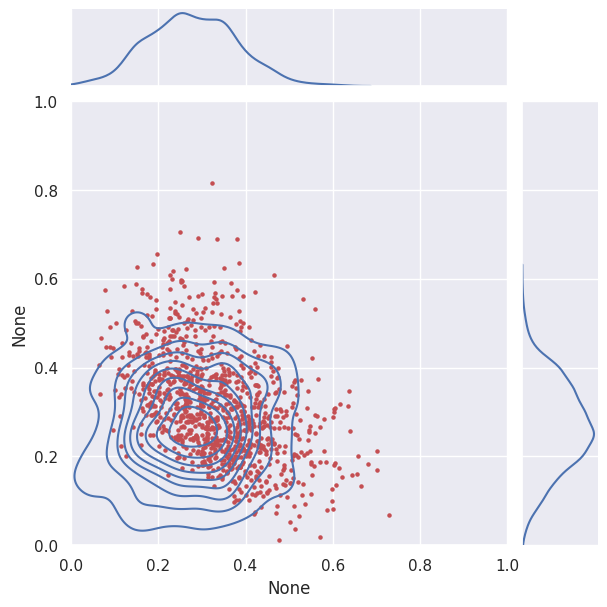

[0.11933086161271383, 0.13298528646194507]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


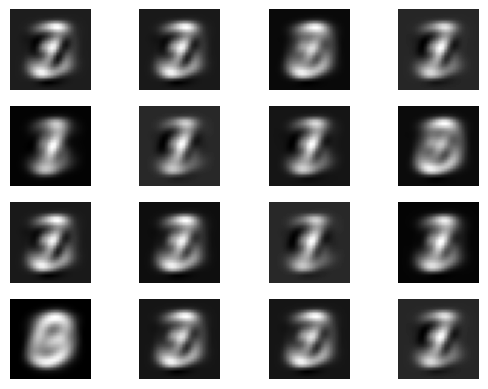

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 9.322563852749428e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


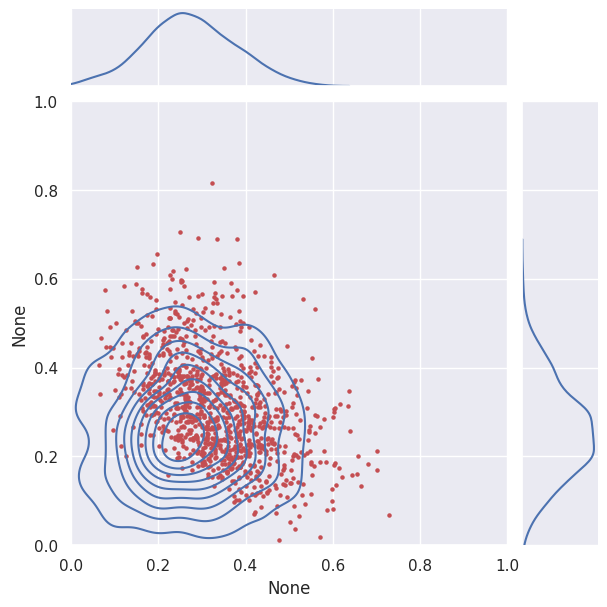

[0.14160804578234062, 0.11121975537559906]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


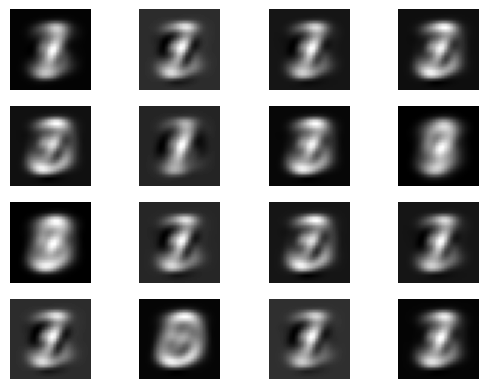

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 8.933981183400544e-05
Discriminator Loss: 7.840581979496502
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


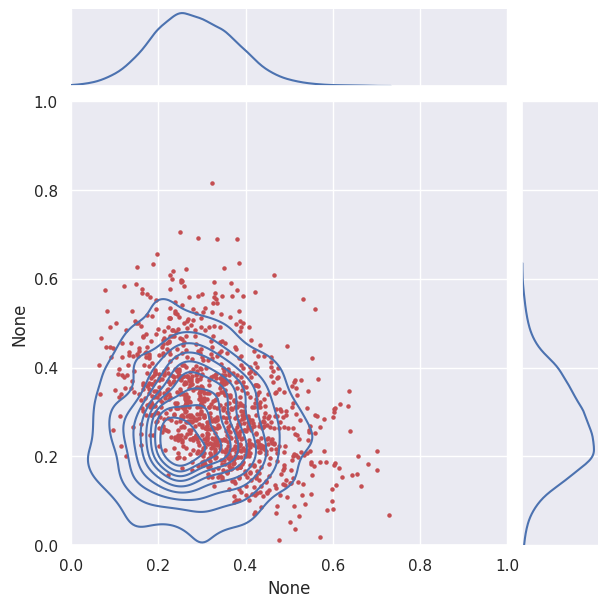

[0.11455795301216859, 0.11866730385805278]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


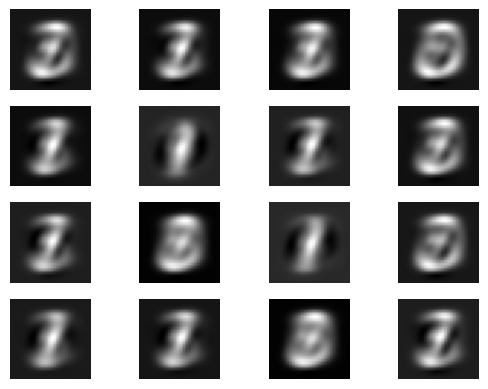

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 5.826719006091934e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


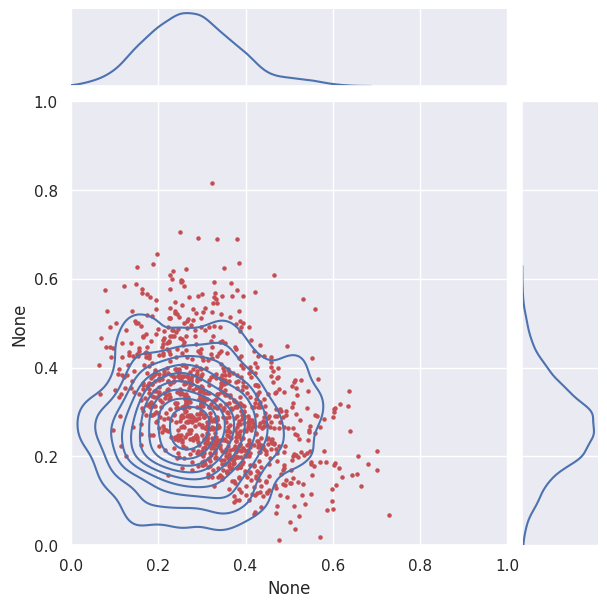

[0.105896941810029, 0.1311540511802337]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499478

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


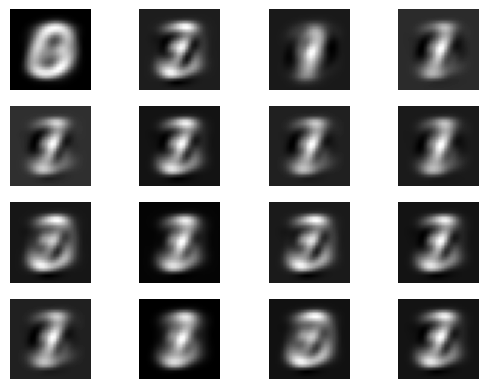

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 5.8264080777624935e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


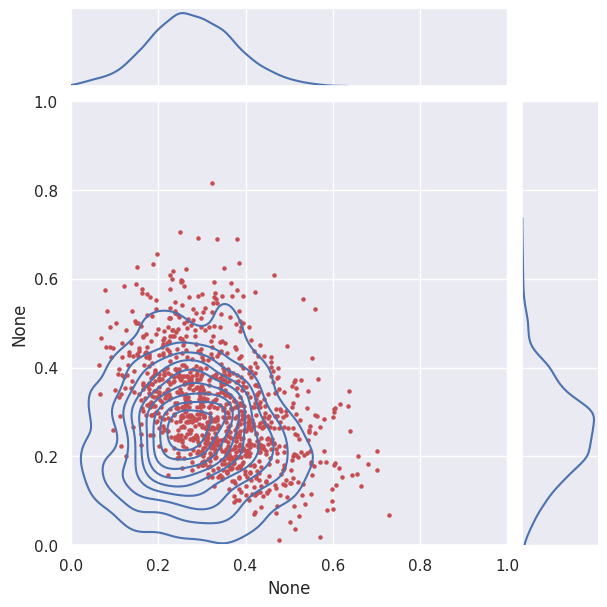

[0.14154711526025682, 0.1019706188571227]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.14994

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


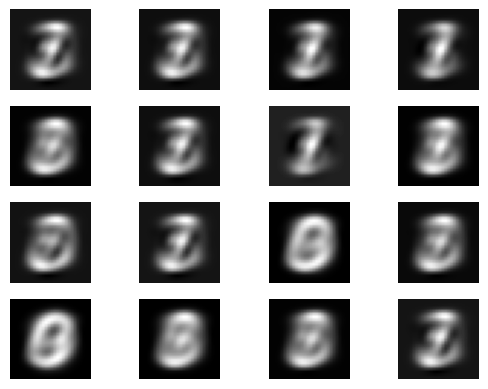

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 5.049553667394162e-05
Discriminator Loss: 7.834500468760261
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


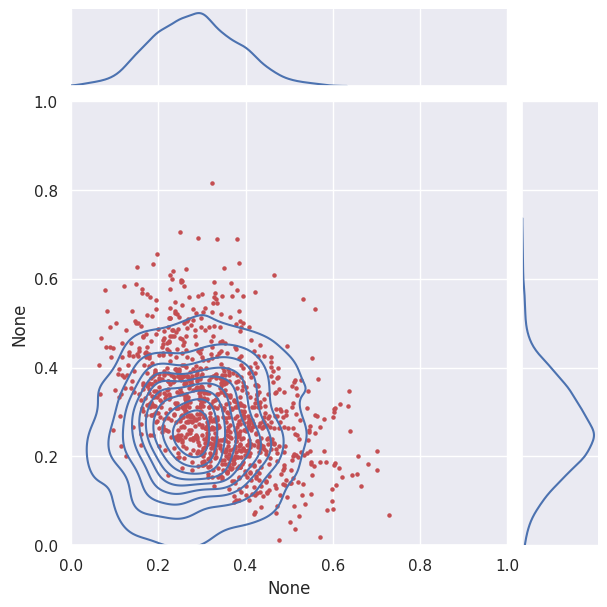

[0.1278277487399047, 0.10952904116309012]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.14994

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


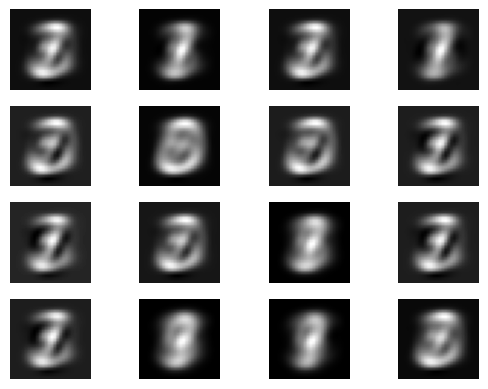

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 5.049553667394162e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


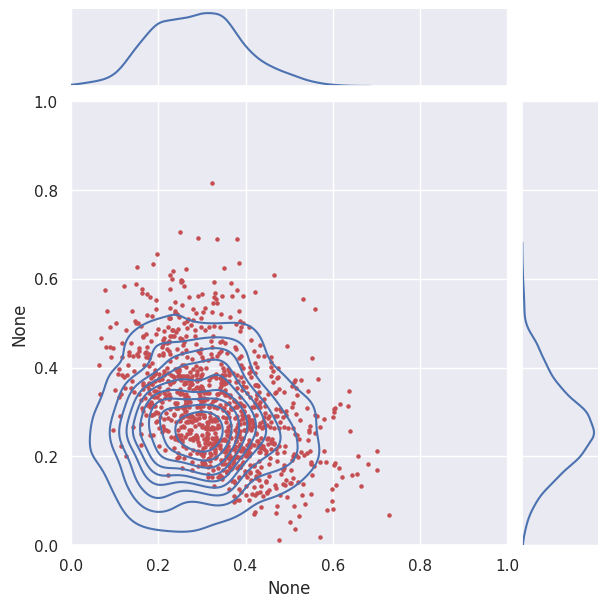

[0.09394881766289546, 0.12094013054456572]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


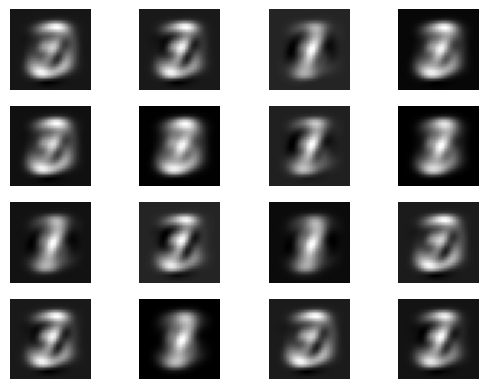

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 5.438136336743047e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


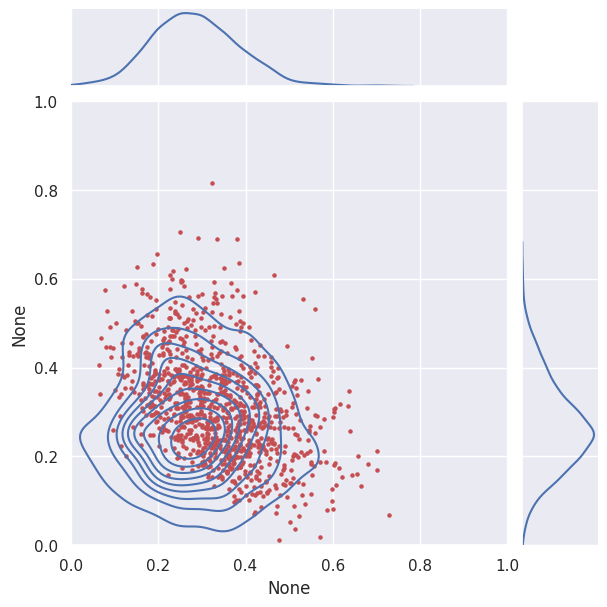

[0.10694791618161648, 0.10646469932988056]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


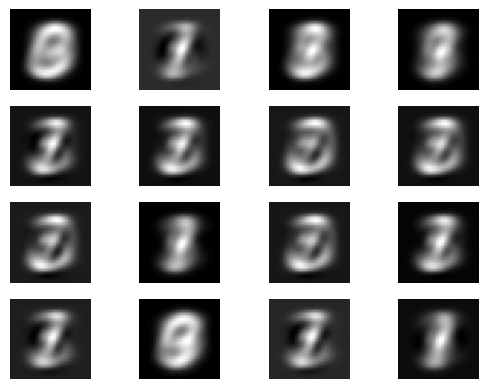

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 2.3307186952697178e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


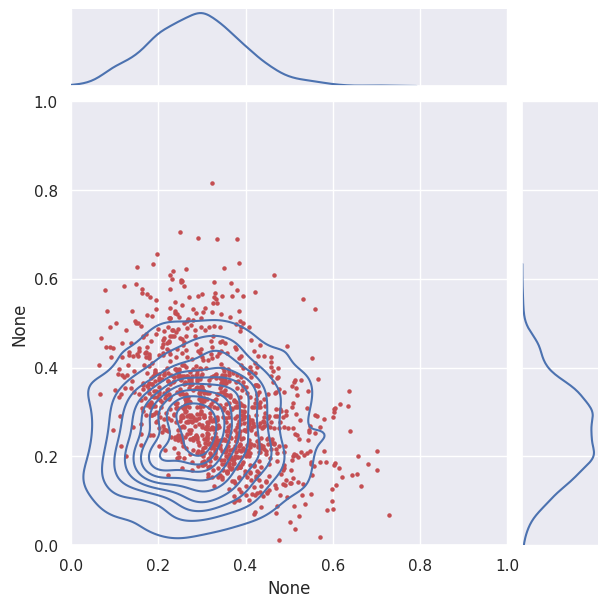

[0.07508520380986497, 0.15717691322606975]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


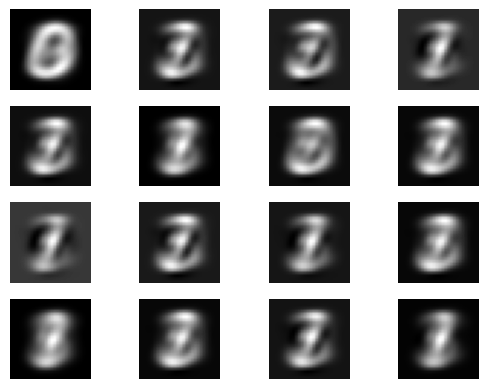

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 3.107573105638051e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


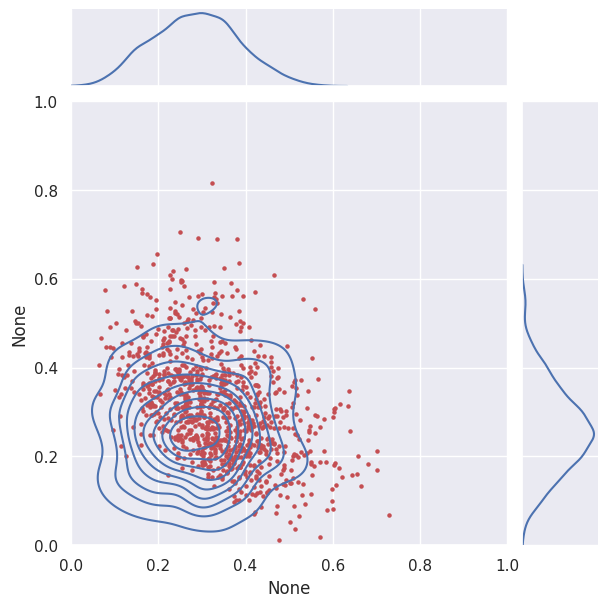

[0.13361537161546566, 0.1341940650726347]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.14994

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


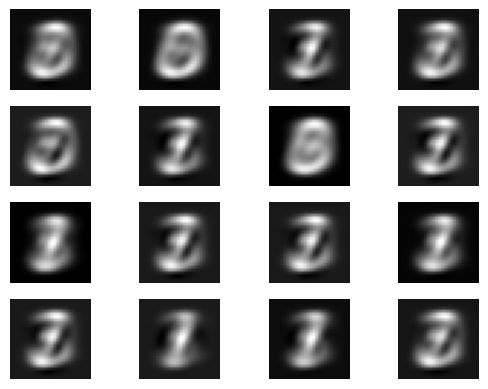

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 3.884582980171104e-05
Discriminator Loss: 7.835713815724084
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


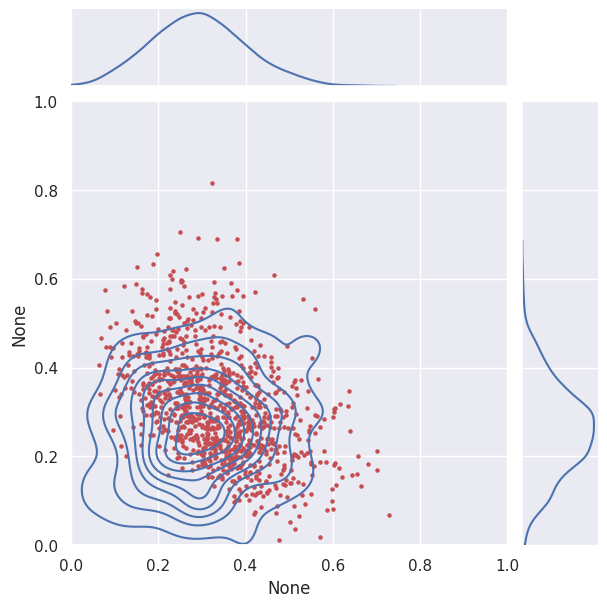

[0.07145577477450799, 0.12015585011107878]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


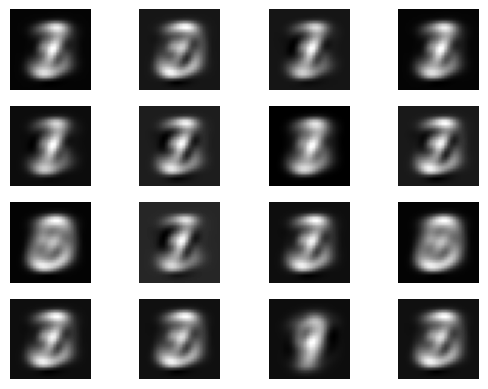

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 3.496000310822217e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


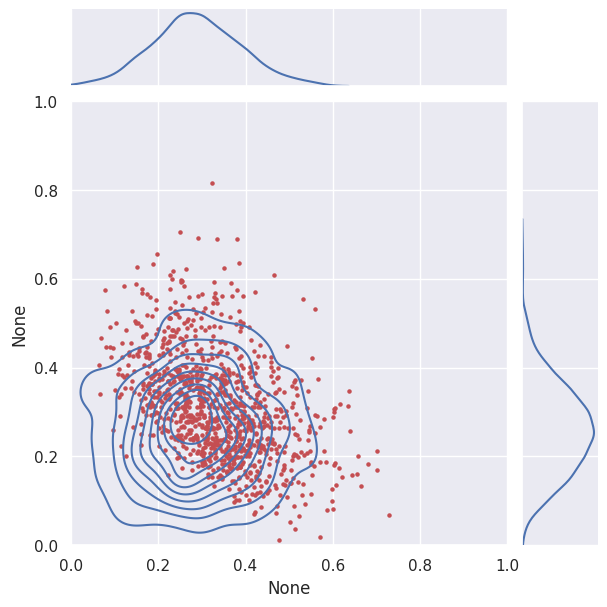

[0.11790008490112677, 0.11451143730592489]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


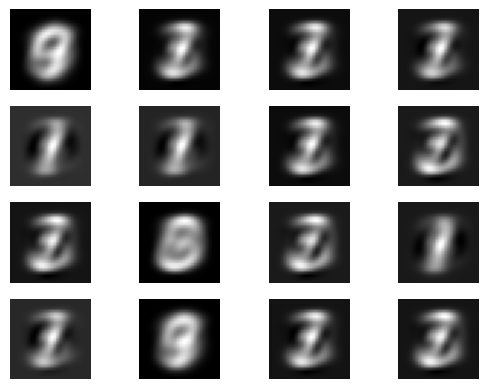

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 5.049864595723603e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


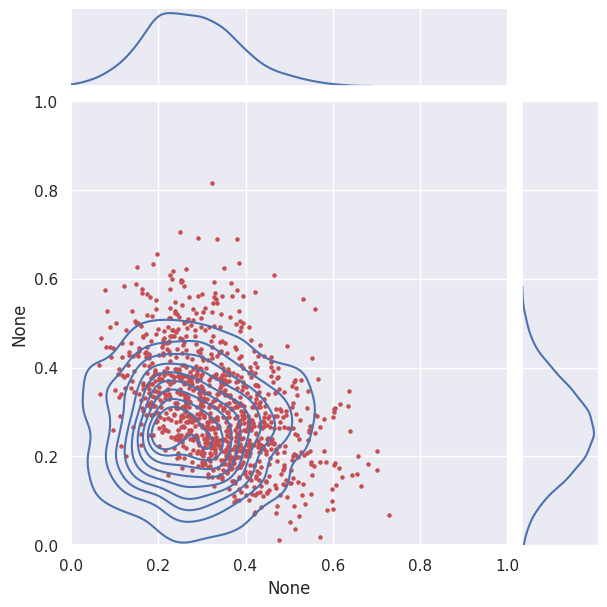

[0.10325242326159827, 0.1357894445977031]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.14994

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


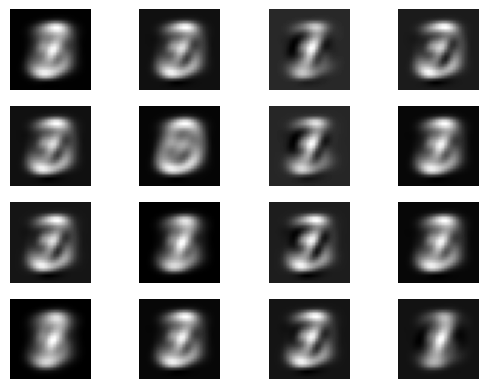

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 3.884272051841664e-05
Discriminator Loss: 7.834096346709903
--------------------


/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


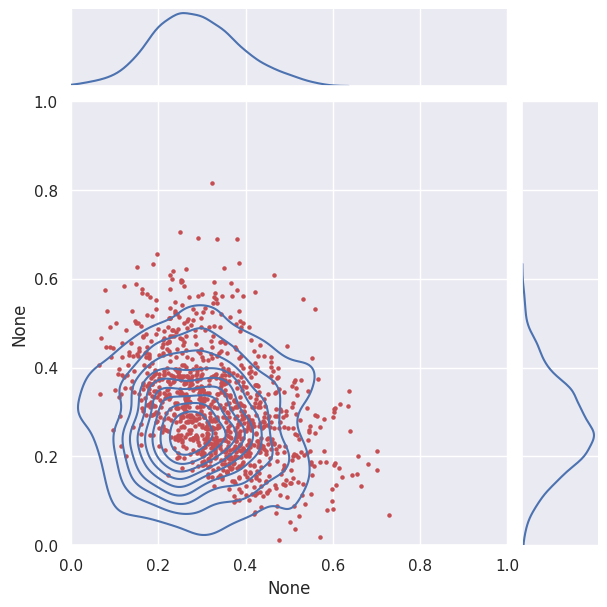

[0.12403341482218556, 0.12290710829838346]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


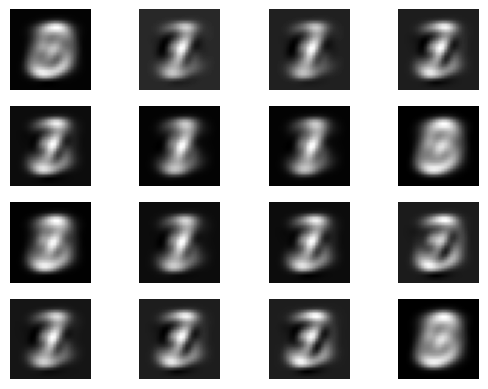

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 4.661281926374716e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


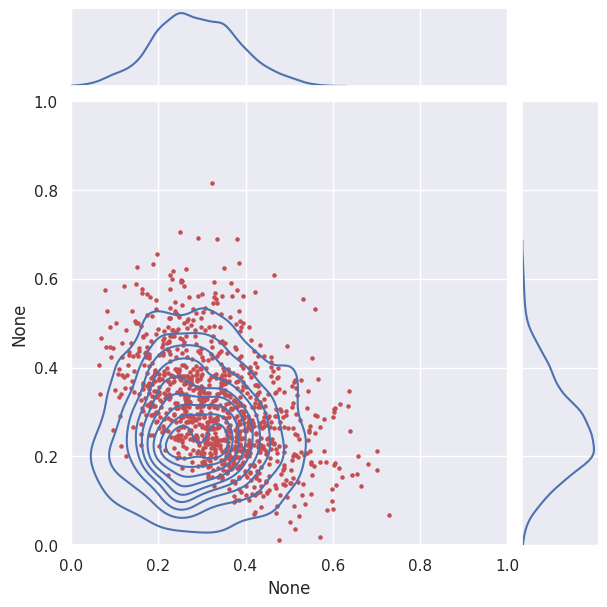

[0.13582884459790812, 0.11135501730553322]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


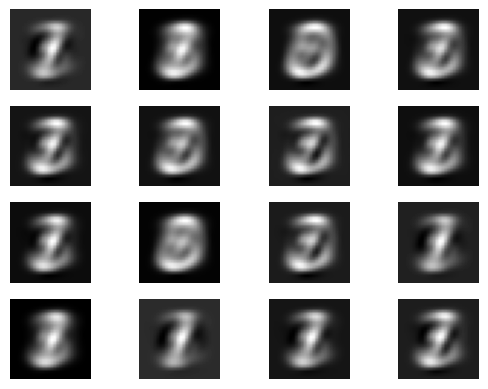

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 3.107573105638051e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


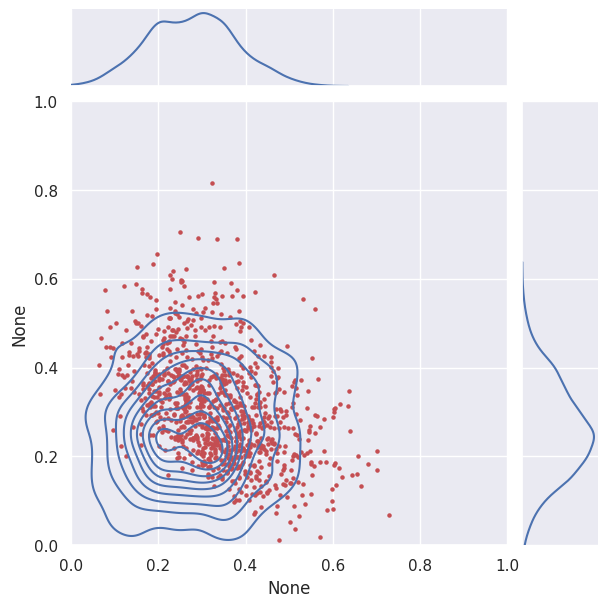

[0.1384670955979813, 0.13110912721411686]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.14994

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


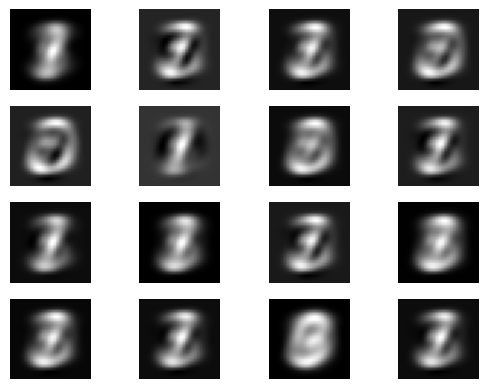

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 2.3305632311049984e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


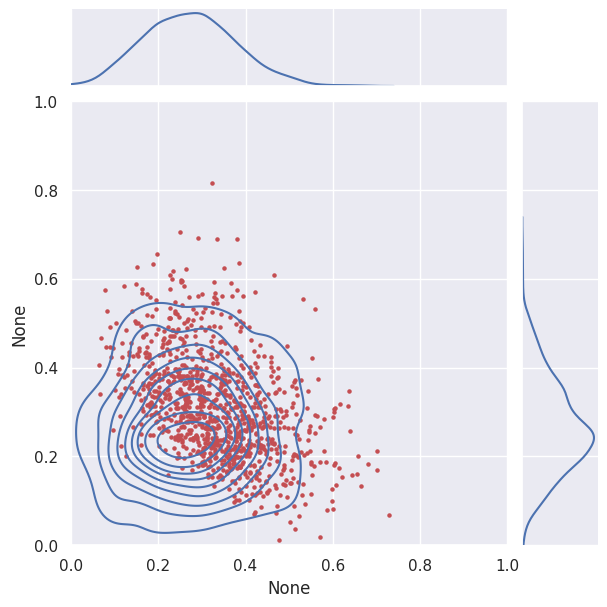

[0.11440115815412112, 0.09595474636558549]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


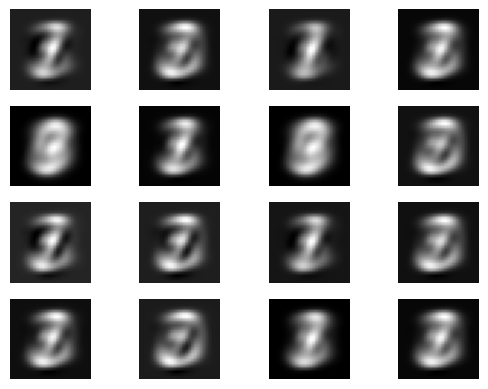

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 2.718990436289165e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


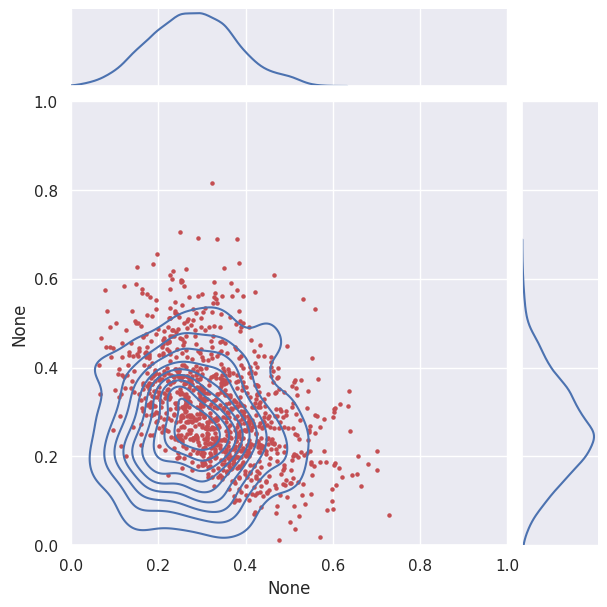

[0.13420032757593828, 0.11022789610844329]
[0.5636426856312021, 0.4752494291772925, 0.4291064686130005, 0.4075689182058624, 0.39184835198775675, 0.35920428304743857, 0.3373340014471519, 0.31906074501907644, 0.3131502540521246, 0.2874939848725354, 0.26805777447205176, 0.2858196397181676, 0.2470085708012973, 0.2533431618377899, 0.22511420021304873, 0.24482337174975946, 0.22581815625300586, 0.22811091050456908, 0.20852015390556855, 0.18844534467014856, 0.21171632629003223, 0.20291591000844278, 0.20624414230058463, 0.17438947534097277, 0.17304570937303354, 0.16736565817506283, 0.18594891167452385, 0.17678272748952967, 0.16155849844116393, 0.1586662365398751, 0.15874654327759824, 0.1487948305623632, 0.16527463110092966, 0.1517153998142343, 0.13054225003807404, 0.16180534045952255, 0.13441492237041797, 0.15001329623175474, 0.14271339930627175, 0.1417227670401328, 0.1679390601874407, 0.13778209289582283, 0.15787548725822254, 0.14900894271567072, 0.13327102361543447, 0.1274101442907701, 0.1499

/tmp/ipykernel_19725/3126637335.py:133: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


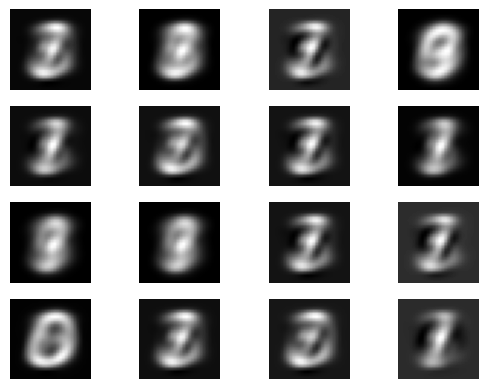

/tmp/ipykernel_19725/1850936150.py:83: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=counts)


Generator Loss: 1.942136025920832e-05
Discriminator Loss: inf
--------------------


/tmp/ipykernel_19725/1850936150.py:129: RuntimeWarning: divide by zero encountered in log
  return -np.log(1-p)
/tmp/ipykernel_19725/3126637335.py:105: DeprecationWarning: The function ``qiskit.execute_function.execute()`` is deprecated as of qiskit 0.46.0. It will be removed in the Qiskit 1.0 release. This function combines ``transpile`` and ``backend.run``, which is covered by ``Sampler`` :mod:`~qiskit.primitives`. Alternatively, you can also run :func:`.transpile` followed by ``backend.run()``.
  job = execute(circ, backend, shots=20)


In [6]:
q=5 # Set it to dimensionality of data *n 2 +. 1
c=1
tracked_kl_div_1 = []
tracked_kl_div_2 = []
# Initialize a quantum circuit with q qubits, and c cbits
# Initializt Ancilla qubit in equi-superposition
circ = QuantumCircuit(q,c)
circ.h(0)
layer_style = "Controlled-Dual"
train_var = init_random_variables(q-1,layer_style)

# Initial Learning Settings such as alpha etc.
tracked_d_loss = []
gradients = []
learning_rate=0.01
train_iter = 250
tracked_g_loss = []
gradients_g = []
corr = 0
wrong= 0 
loss_d_to_g = 0
loss_d_to_real = 0
tracked_loss_d_to_g = []
tracked_loss_d_to_real = []
train_on_fake = 5
df = [0,0]
print('Starting Training')
print('-'*20)

for epoch in np.arange(1,100):
    par_shift = 0.5*np.pi*np.sqrt(1/(epoch+1))
    # ------------------------------------------------------------------------------------------
    # This section is the discriminator training section
    # Each data point is tested against a random number, of which it decidesa wheter to 
    # Train against discerning between fake or real 
    # This causes "unstable" loss functions, but not very "unstable". Just slightly inconsistent
    # ------------------------------------------------------------------------------------------
    counter = 0
    for _ in range(1):
        for key,value in train_var.items():
            if str(q//2 + 1 ) in key:
                break
            for key_value in range(len(value)):
                forward_diff = cost_function(get_probabilities(disc_fake_training_circuit(train_var,key,key_value,diff=True,fwd_diff=True)),1,None)
                backward_diff = cost_function(get_probabilities(disc_fake_training_circuit(train_var,key,key_value,diff=True,fwd_diff=False)),1,None)
                df = 0.5*(forward_diff-backward_diff)
                if abs(df)>1:
                    df = df/abs(df)
                #train_var[key][key_value] -= df*learning_rate/10
    for index,point in enumerate(pca_data_rot):
        df = [0,0]
        gradients = []
        loss= [0,0]
        #Training the Discriminator:
        for key,value in train_var.items():
            if str(q//2 + 1) in key:
                break
            for key_value in range(len(value)):
                #TRAIN ON REAL DATA
                # BETIS HERE
                # _________
                forward_diff = cost_function(get_probabilities(disc_real_training_circuit(train_var,point,key,key_value,diff=True,fwd_diff=True)),0,None)
                backward_diff = cost_function(get_probabilities(disc_real_training_circuit(train_var,point,key,key_value,diff=True,fwd_diff=False)),0,None)
                df = 0.5*(forward_diff-backward_diff)
                train_var[key][key_value] -= learning_rate*df
        loss[0] += cost_function(get_probabilities(disc_real_training_circuit(train_var,point,key,key_value,diff=False,fwd_diff=False)),0,None)
        loss[1] += 1
    loss_g = [0,0]
    # ------------------------------------------------------------------------------------------
    # This section is the generator training section
    # The discriminator just looks to fool the state we learnt above 
    # This means that instead of learning 10000 times, we could up the learning rate and just learn a few more times
    # We dont want it to be too large so it spins around the qubits state
    # ------------------------------------------------------------------------------------------
    #Train the generator now as much as we trained the Disc
    for _ in range(len(pca_data_rot)//10):
        gen_params=True
        for key,value in train_var.items():
            if str(q//2 + 1) not in key and gen_params:
                #print(f"{key} is not a GAN parameter")
                continue
            else: 
                gen_params = False
            for key_value in range(len(value)):
                #TRAIN ON FAKE DATA
                forward_diff = generator_cost_function(get_probabilities(disc_fake_training_circuit(train_var,key,key_value,diff=True,fwd_diff=True)))
                backward_diff = generator_cost_function(get_probabilities(disc_fake_training_circuit(train_var,key,key_value,diff=True,fwd_diff=False)))
                df = 0.5*(forward_diff-backward_diff)
                train_var[key][key_value] -= df*learning_rate*2.5
        loss_g[0] += generator_cost_function(get_probabilities(disc_fake_training_circuit(train_var,key,key_value,diff=False,fwd_diff=False)))
        loss_g[1] +=1
    print(f"Generator Loss: {loss_g[0]/loss_g[1]}")
    tracked_g_loss.append(loss_g[0]/loss_g[1])
    loss_qgan = cost_function(get_probabilities(disc_fake_training_circuit(train_var,key,key_value,diff=False,fwd_diff=False)),1,None) 
    t_loss = loss_qgan + (loss[0]/loss[1])
    tracked_loss_d_to_real.append(loss[0]/loss[1])
    tracked_loss_d_to_g.append(loss_qgan)
    print(f"Discriminator Loss: {t_loss}")
    tracked_d_loss.append(t_loss)
    print("-"*20)
    data = []
    circ = disc_fake_training_circuit(train_var,point,key,key_value,Sample=True)
    n_results = q//2
    for _ in range(500):
        job = execute(circ, backend, shots=20)
        results = job.result().get_counts(circ)
        bins = [[0,0] for _ in range(n_results)]
        for key,value in results.items():
            for i in range(n_results):
                if key[-i-1]== '1':
                    bins[i][0] += value
                bins[i][1] += value
        for i,pair in enumerate(bins):
            bins[i]= pair[0]/pair[1]
        data.append(bins)
    data = np.array(data)
    try:
        graph = sns.jointplot(x=data[:,0],y=data[:,1],kind="kde",ylim=(0,1),xlim=(0,1))
        graph.x = pca_data[:,0]
        graph.y = pca_data[:,1]
        graph.plot_joint(plt.scatter, marker='o', c='r', s=5)
        plt.show()
    except:
        pass
    plt.savefig("qgan_ICLR_-epoch-mnist-{}-generated-distribution".format(epoch))
    dim1_kl_div = generate_kl_divergence_hist(pca_data, data)
    print(dim1_kl_div)
    tracked_kl_div_1.append(np.mean(np.array(dim1_kl_div)))
    print(tracked_kl_div_1)
    # For accurate KL Div we need to usue higher shots
    data = []
    for _ in range(16):
        job = execute(circ, backend, shots=20)
        results = job.result().get_counts(circ)
        bins = [[0,0] for _ in range(n_results)]
        for key,value in results.items():
            for i in range(n_results):
                if key[-i-1]== '1':
                    bins[i][0] += value
                bins[i][1] += value
        for i,pair in enumerate(bins):
            bins[i]= pair[0]/pair[1]
        data.append(bins)
    data = np.array(data)
    new_info = descale_points(data[:16])
    new_info = new_info.reshape(new_info.shape[0],28,28)
    print(f"Epoch {epoch} Generated Images")
    for i in range(new_info.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(new_info[i, :, :], cmap='gray')
        plt.axis('off')
    plt.savefig("qgan_ICLR_-epoch-mnist-{}-generated-images".format(epoch))
    plt.show()
    with open('new_qgan_results_mnis_epoch_ICLR_{}.txt'.format(epoch), 'w') as file:
        file.write("Tracked KL Divergence\n")
        file.write(str(tracked_kl_div_1)+"\n")
        file.write("Loss Of Generator\n")
        file.write(str(tracked_g_loss)+"\n")
        file.write("Loss Of Discriminator\n")
        file.write(str(tracked_d_loss)+"\n")
    save_variables(train_var,epoch)